<a href="https://colab.research.google.com/github/samarranjit/Yield_Prediction/blob/main/30mresolution_data/30m_resolution_datasets.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
%ls

data/                                            learning_curves.png
Dense_Neural_Network_For_Yield_Prediction.ipynb  metrics_comparison.png
dnn_model_tuned_best.keras                       pca_variables/
error_distribution.png                           predictions_analysis.png
feature_importance.png                           scaler_X.pkl
final_soybean_yield_model.h5                     scaler_y.pkl
hyperparam_tuning/                               soybean_yield_dnn_best.h5
hyperparam_tuning_layers_only/                   soybean_yield_dnn_best.keras


## Importing the dataset

In [2]:

# df_soybeans = pd.read_parquet(r"/content/drive/MyDrive/Colab Notebooks/Data For Yield Prediction/30mdatasets/datafiles/Soybeans_30m.parquet")
df_soybeans = pd.read_parquet(r"./data/30m_resolution_data/Soybeans_30m.parquet")
df_soybeans.info()

# df_corn = pd.read_parquet(r"/content/drive/MyDrive/Colab Notebooks/Data For Yield Prediction/30mdatasets/datafiles/Corn_30m.parquet")
df_corn = pd.read_parquet(r"./data/30m_resolution_data/Corn_30m.parquet")
df_corn.info()

# df_wheat = pd.read_parquet(r"/content/drive/MyDrive/Colab Notebooks/Data For Yield Prediction/30mdatasets/datafiles/Wheat_30m.parquet")
df_wheat = pd.read_parquet(r"./data/30m_resolution_data/Wheat_30m.parquet")
df_wheat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29155 entries, 0 to 29154
Data columns (total 50 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   system:index     29155 non-null  int64  
 1   EVI_max          29155 non-null  float64
 2   EVI_mean         29155 non-null  float64
 3   EVI_range        29155 non-null  float64
 4   GI_max           29155 non-null  float64
 5   GI_mean          29155 non-null  float64
 6   GI_range         29155 non-null  float64
 7   LST_max          29155 non-null  float64
 8   LST_median       29155 non-null  float64
 9   LST_range        29155 non-null  float64
 10  NDVI_max         29155 non-null  float64
 11  NDVI_mean        29155 non-null  float64
 12  NDVI_range       29155 non-null  float64
 13  NDWI_max         29155 non-null  float64
 14  NDWI_mean        29155 non-null  float64
 15  NDWI_range       29155 non-null  float64
 16  Precip_Max_mm    29155 non-null  float64
 17  Precip_Mean_

In [3]:
df = df_soybeans.copy()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29155 entries, 0 to 29154
Data columns (total 50 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   system:index     29155 non-null  int64  
 1   EVI_max          29155 non-null  float64
 2   EVI_mean         29155 non-null  float64
 3   EVI_range        29155 non-null  float64
 4   GI_max           29155 non-null  float64
 5   GI_mean          29155 non-null  float64
 6   GI_range         29155 non-null  float64
 7   LST_max          29155 non-null  float64
 8   LST_median       29155 non-null  float64
 9   LST_range        29155 non-null  float64
 10  NDVI_max         29155 non-null  float64
 11  NDVI_mean        29155 non-null  float64
 12  NDVI_range       29155 non-null  float64
 13  NDWI_max         29155 non-null  float64
 14  NDWI_mean        29155 non-null  float64
 15  NDWI_range       29155 non-null  float64
 16  Precip_Max_mm    29155 non-null  float64
 17  Precip_Mean_

In [36]:
df.keys()

Index(['system:index', 'EVI_max', 'EVI_mean', 'EVI_range', 'GI_max', 'GI_mean',
       'GI_range', 'LST_max', 'LST_median', 'LST_range', 'NDVI_max',
       'NDVI_mean', 'NDVI_range', 'NDWI_max', 'NDWI_mean', 'NDWI_range',
       'Precip_Max_mm', 'Precip_Mean_mm', 'Precip_Total_mm', 'Soil_Alpha',
       'Soil_BD', 'Soil_Clay', 'Soil_Ksat', 'Soil_Lambda', 'Soil_N', 'Soil_OM',
       'Soil_Sand', 'Soil_Silt', 'Soil_Theta_R', 'Soil_Theta_S', 'Soil_pH',
       'Tr_SWIR1_max', 'Tr_SWIR1_mean', 'Tr_SWIR1_range', 'Tr_SWIR2_max',
       'Tr_SWIR2_mean', 'Tr_SWIR2_range', 'latitude', 'longitude', '.geo',
       'x_m', 'y_m', 'elevation', 'slope', 'aspect', 'yield_mean', 'yield_std',
       'yield_count', 'year', 'field'],
      dtype='object')

In [13]:
# How many rows are missing precipitation?
df[['Precip_Total_mm','Precip_Mean_mm','Precip_Max_mm']].isna().sum()


Precip_Total_mm    0
Precip_Mean_mm     0
Precip_Max_mm      0
dtype: int64

In [16]:
(df['Precip_Total_mm'].isna() ==
 df['Precip_Mean_mm'].isna()).all()


np.True_

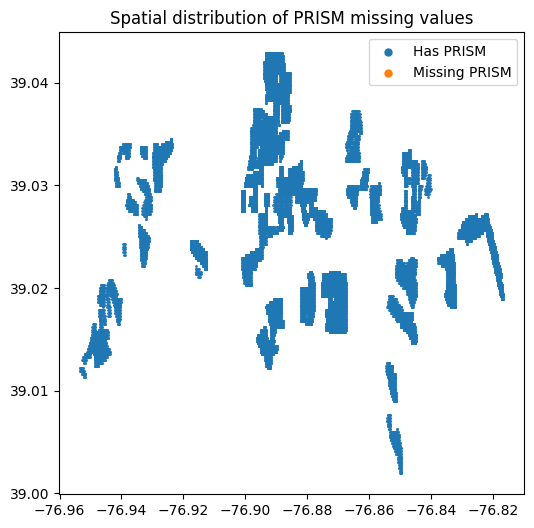

In [14]:
import matplotlib.pyplot as plt

mask_na = df['Precip_Total_mm'].isna()

plt.figure(figsize=(6,6))
plt.scatter(
    df.loc[~mask_na, 'longitude'],
    df.loc[~mask_na, 'latitude'],
    s=1, label='Has PRISM'
)
plt.scatter(
    df.loc[mask_na, 'longitude'],
    df.loc[mask_na, 'latitude'],
    s=1, label='Missing PRISM'
)
plt.legend(markerscale=5)
plt.title("Spatial distribution of PRISM missing values")
plt.show()


In [18]:
df.keys()

Index(['system:index', 'EVI_max', 'EVI_mean', 'EVI_range', 'GI_max', 'GI_mean',
       'GI_range', 'LST_max', 'LST_median', 'LST_range', 'NDVI_max',
       'NDVI_mean', 'NDVI_range', 'NDWI_max', 'NDWI_mean', 'NDWI_range',
       'Precip_Max_mm', 'Precip_Mean_mm', 'Precip_Total_mm', 'Soil_Alpha',
       'Soil_BD', 'Soil_Clay', 'Soil_Ksat', 'Soil_Lambda', 'Soil_N', 'Soil_OM',
       'Soil_Sand', 'Soil_Silt', 'Soil_Theta_R', 'Soil_Theta_S', 'Soil_pH',
       'Tr_SWIR1_max', 'Tr_SWIR1_mean', 'Tr_SWIR1_range', 'Tr_SWIR2_max',
       'Tr_SWIR2_mean', 'Tr_SWIR2_range', 'latitude', 'longitude', '.geo',
       'x_m', 'y_m', 'elevation', 'slope', 'aspect', 'yield_mean', 'yield_std',
       'yield_count', 'year', 'field'],
      dtype='object')

### Clearning the dataset

In [4]:
df.drop(columns=['system:index','latitude', 'longitude', '.geo',
       'x_m', 'y_m', 'yield_std',
       'yield_count',  ], inplace= True)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29155 entries, 0 to 29154
Data columns (total 42 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   EVI_max          29155 non-null  float64
 1   EVI_mean         29155 non-null  float64
 2   EVI_range        29155 non-null  float64
 3   GI_max           29155 non-null  float64
 4   GI_mean          29155 non-null  float64
 5   GI_range         29155 non-null  float64
 6   LST_max          29155 non-null  float64
 7   LST_median       29155 non-null  float64
 8   LST_range        29155 non-null  float64
 9   NDVI_max         29155 non-null  float64
 10  NDVI_mean        29155 non-null  float64
 11  NDVI_range       29155 non-null  float64
 12  NDWI_max         29155 non-null  float64
 13  NDWI_mean        29155 non-null  float64
 14  NDWI_range       29155 non-null  float64
 15  Precip_Max_mm    29155 non-null  float64
 16  Precip_Mean_mm   29155 non-null  float64
 17  Precip_Total

EVI_max


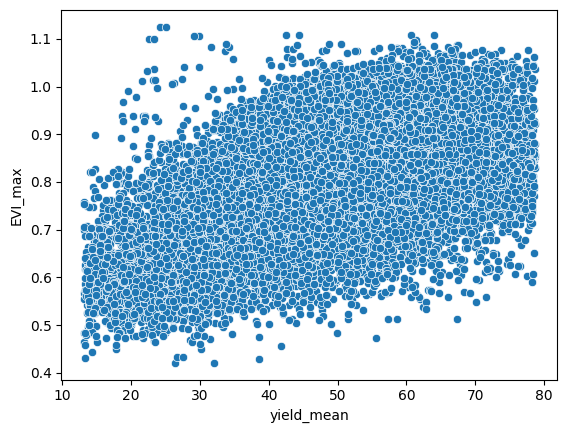

#############################################################################
EVI_mean


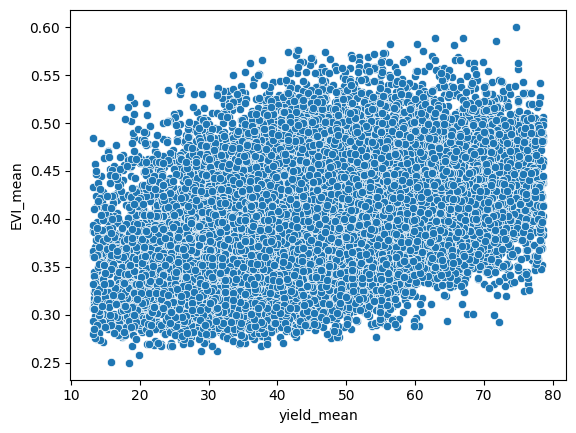

#############################################################################
EVI_range


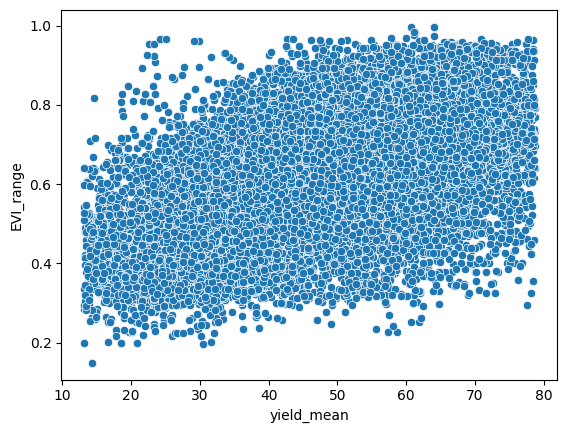

#############################################################################
GI_max


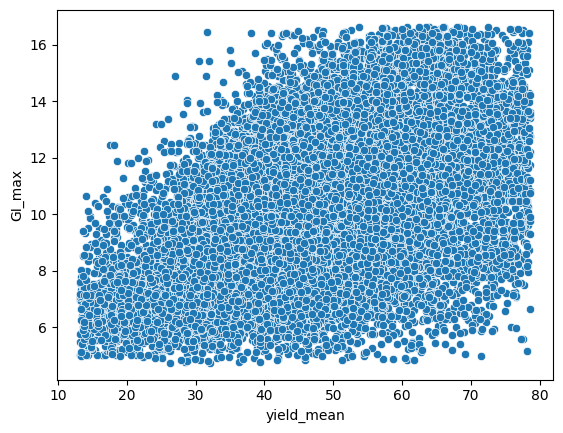

#############################################################################
GI_mean


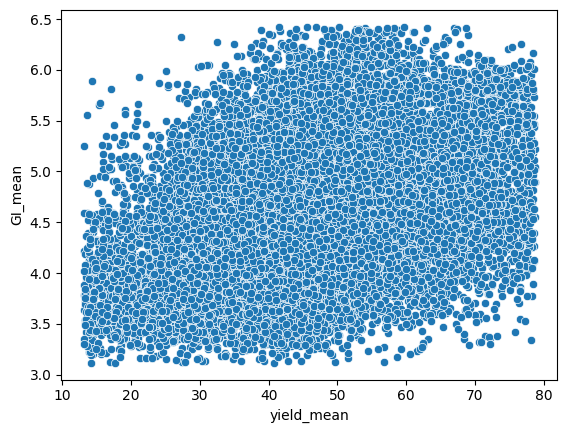

#############################################################################
GI_range


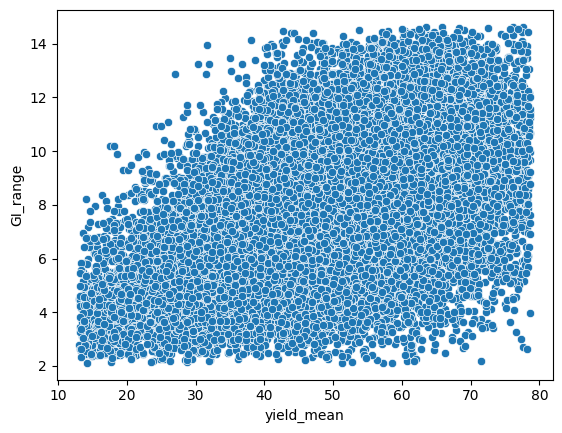

#############################################################################
LST_max


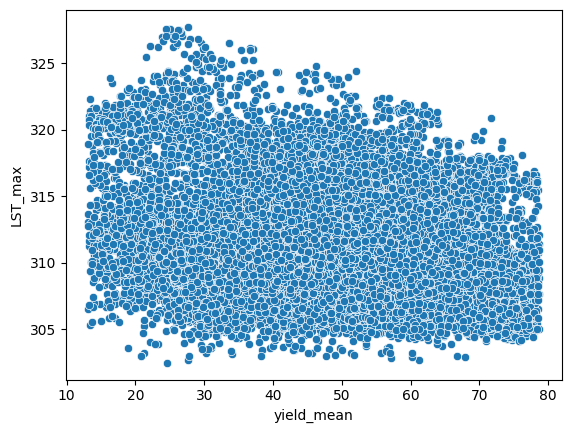

#############################################################################
LST_median


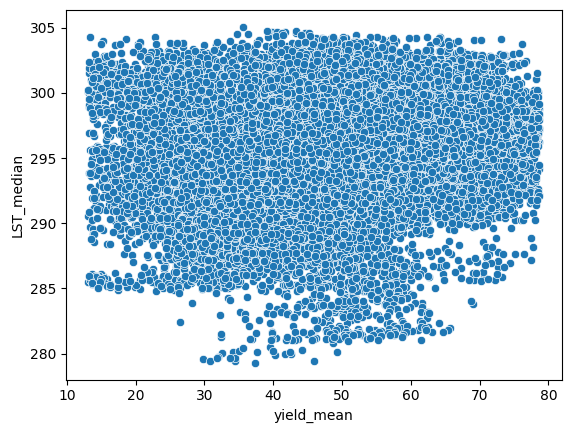

#############################################################################
LST_range


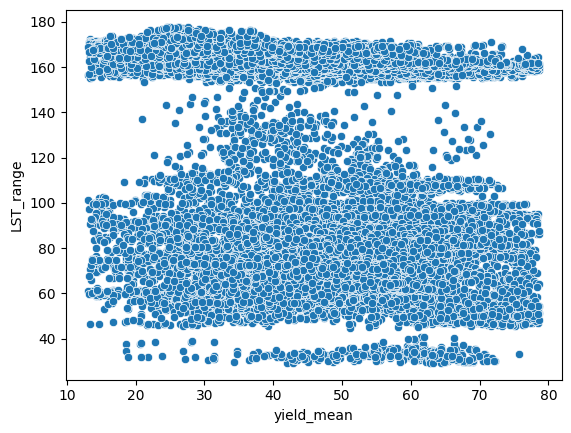

#############################################################################
NDVI_max


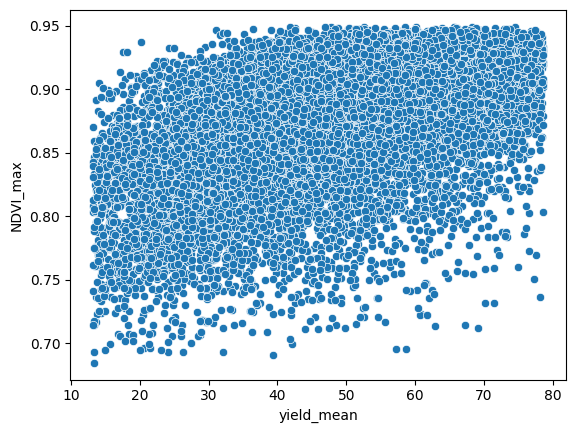

#############################################################################
NDVI_mean


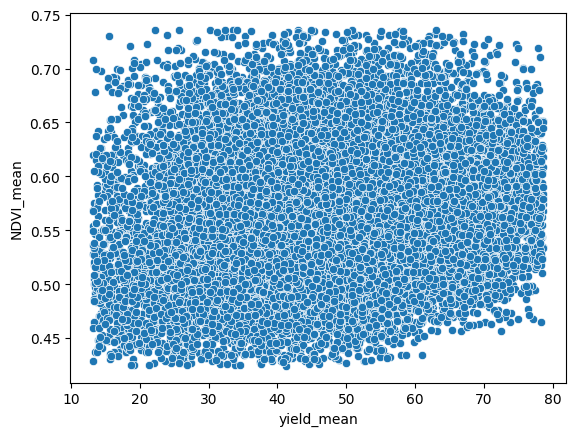

#############################################################################
NDVI_range


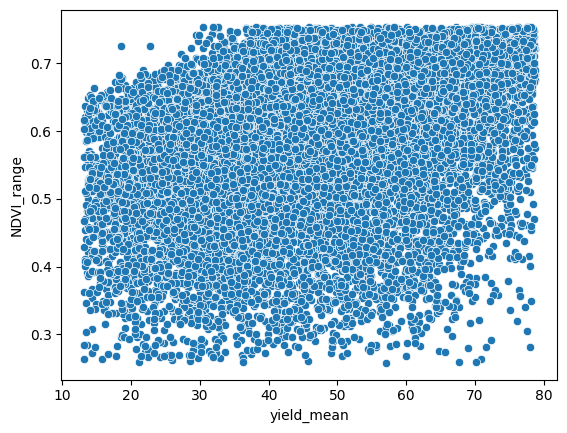

#############################################################################
NDWI_max


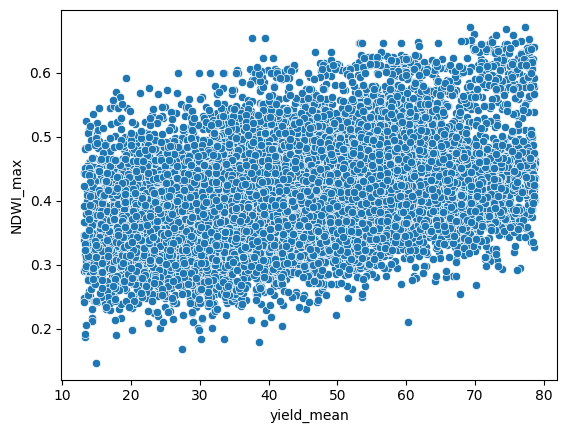

#############################################################################
NDWI_mean


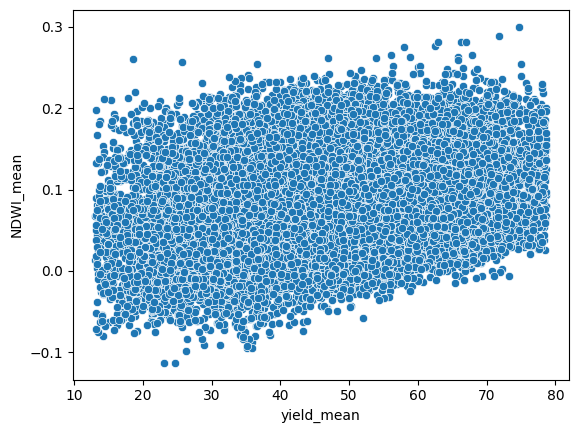

#############################################################################
NDWI_range


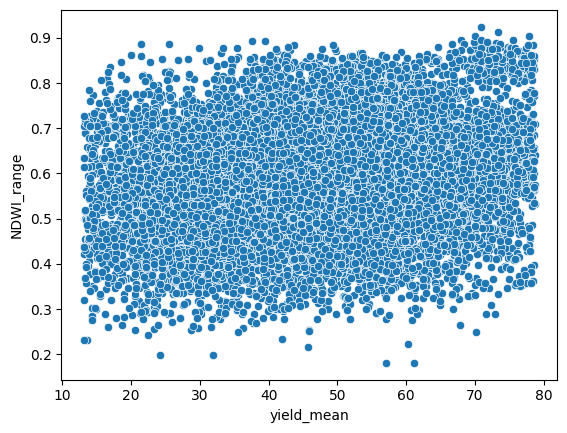

#############################################################################
Precip_Max_mm


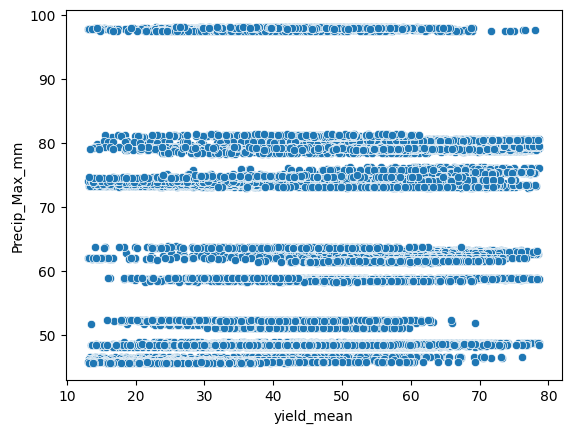

#############################################################################
Precip_Mean_mm


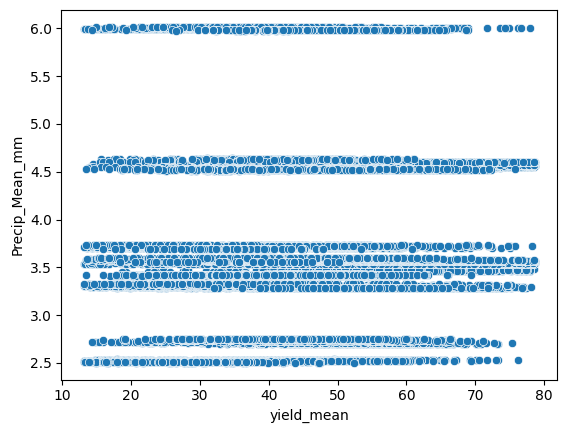

#############################################################################
Precip_Total_mm


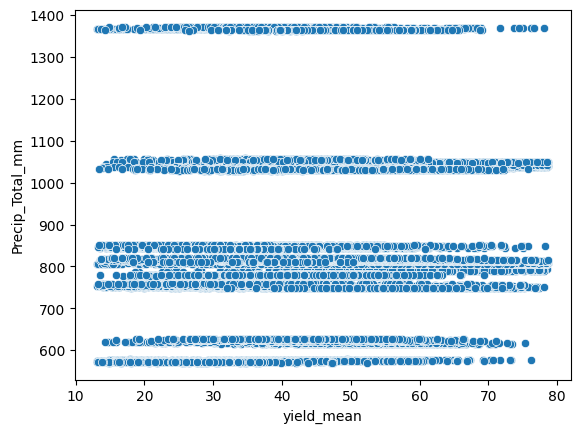

#############################################################################
Soil_Alpha


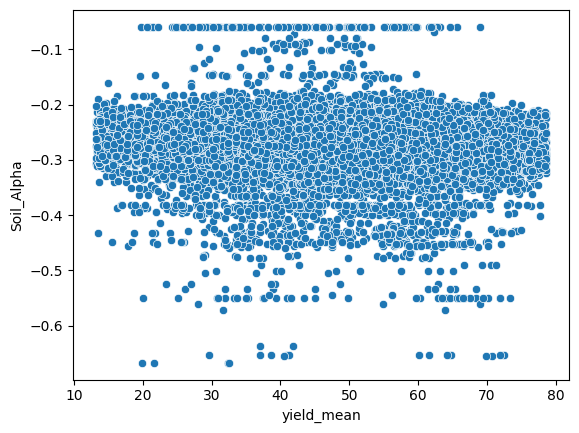

#############################################################################
Soil_BD


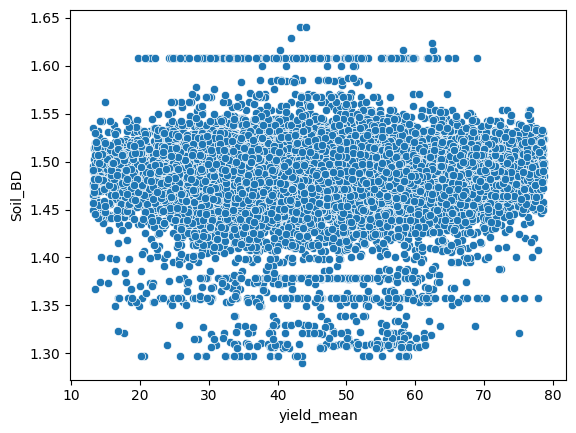

#############################################################################
Soil_Clay


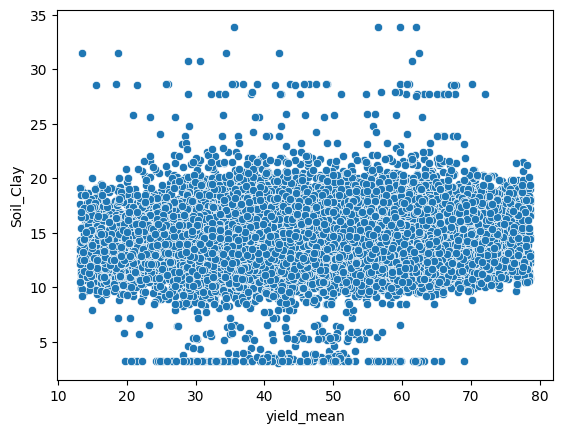

#############################################################################
Soil_Ksat


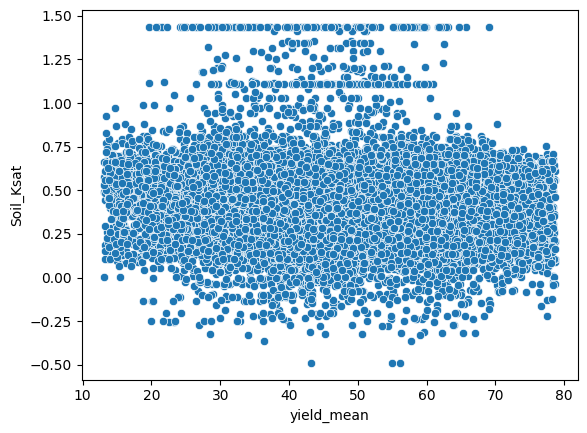

#############################################################################
Soil_Lambda


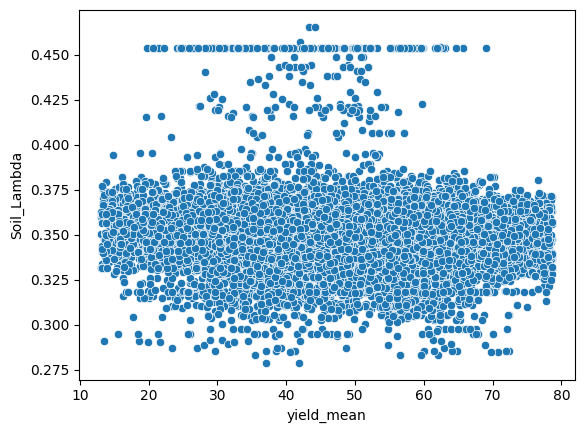

#############################################################################
Soil_N


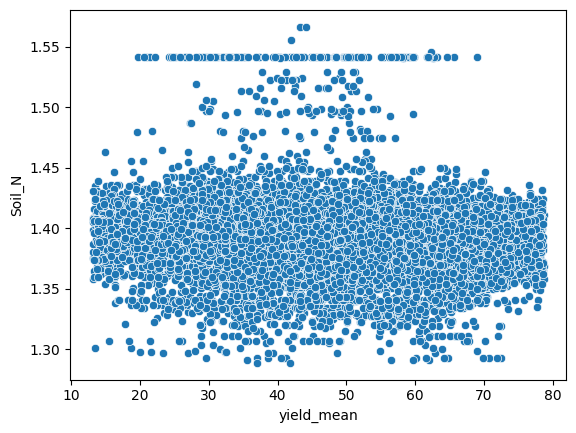

#############################################################################
Soil_OM


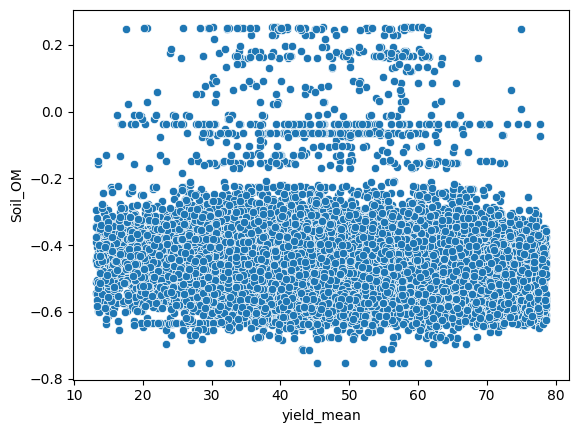

#############################################################################
Soil_Sand


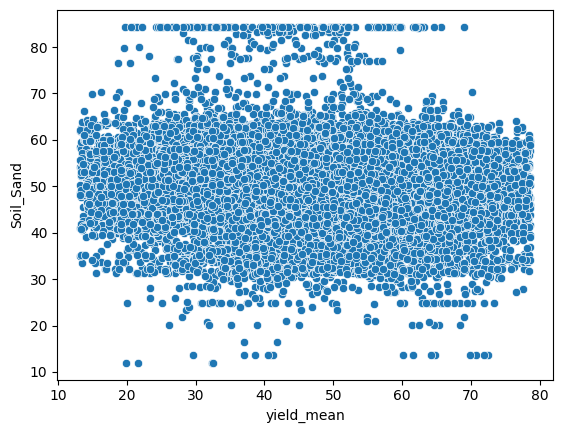

#############################################################################
Soil_Silt


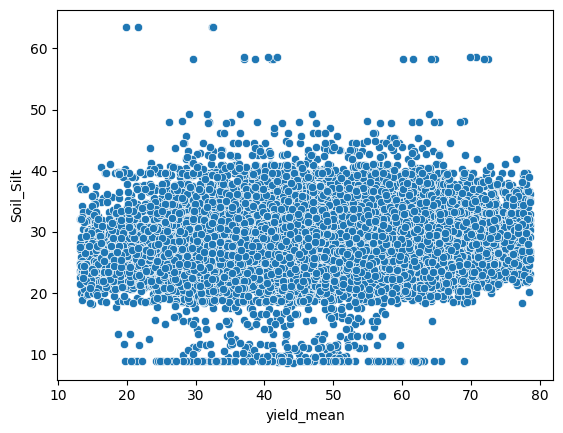

#############################################################################
Soil_Theta_R


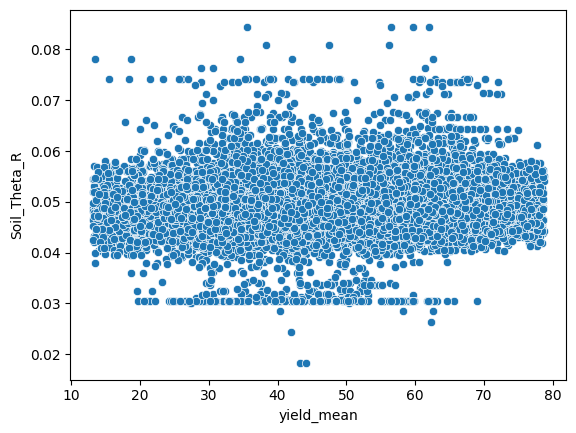

#############################################################################
Soil_Theta_S


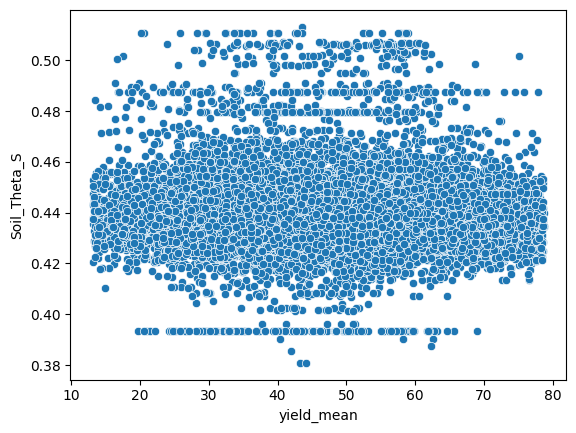

#############################################################################
Soil_pH


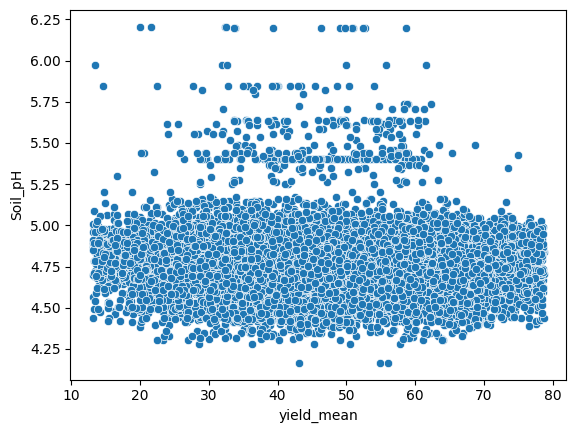

#############################################################################
Tr_SWIR1_max


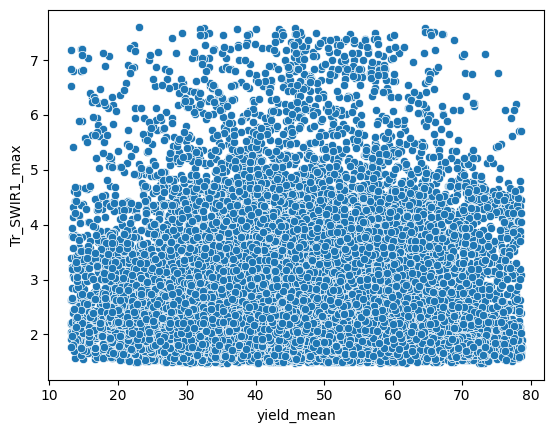

#############################################################################
Tr_SWIR1_mean


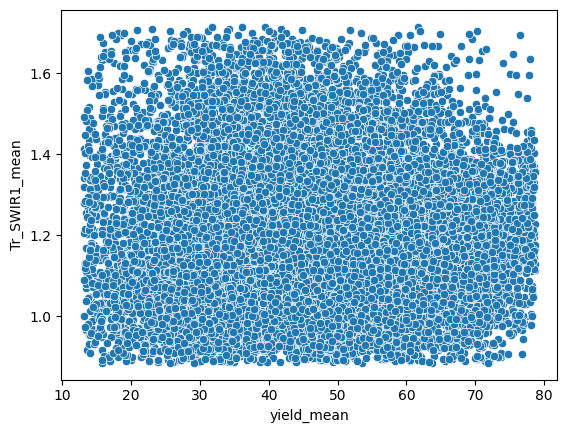

#############################################################################
Tr_SWIR1_range


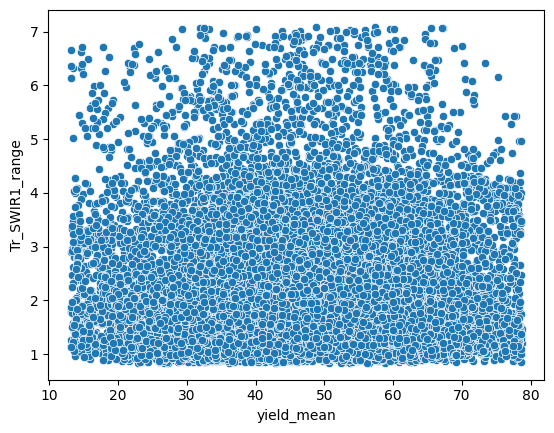

#############################################################################
Tr_SWIR2_max


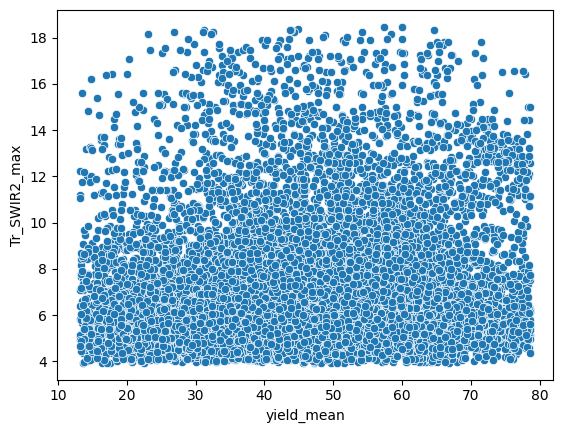

#############################################################################
Tr_SWIR2_mean


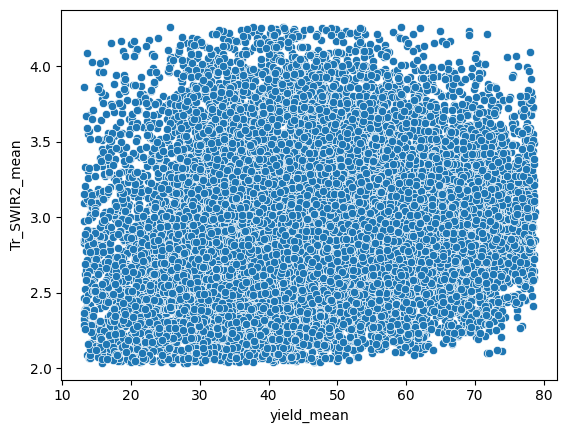

#############################################################################
Tr_SWIR2_range


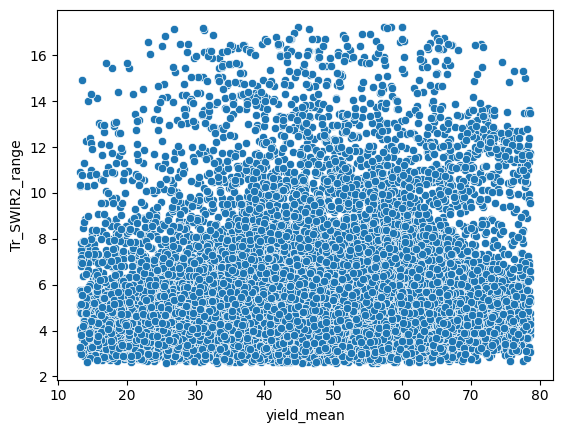

#############################################################################
elevation


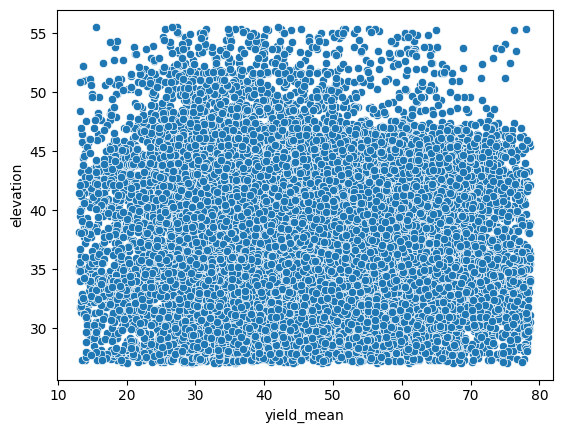

#############################################################################
slope


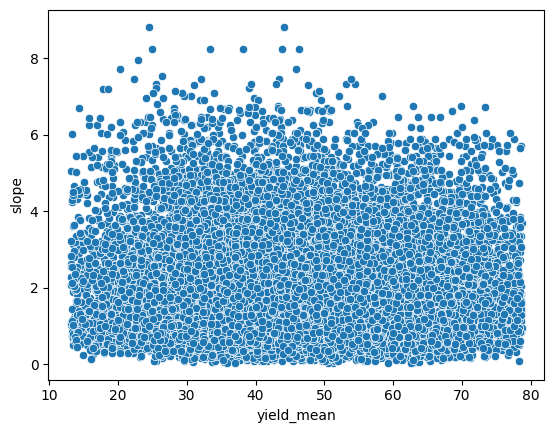

#############################################################################
aspect


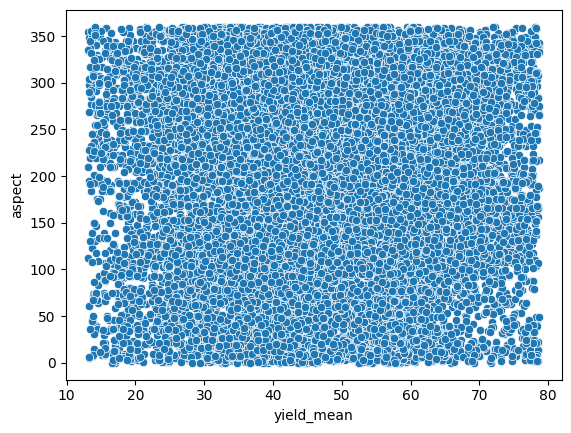

#############################################################################
yield_mean


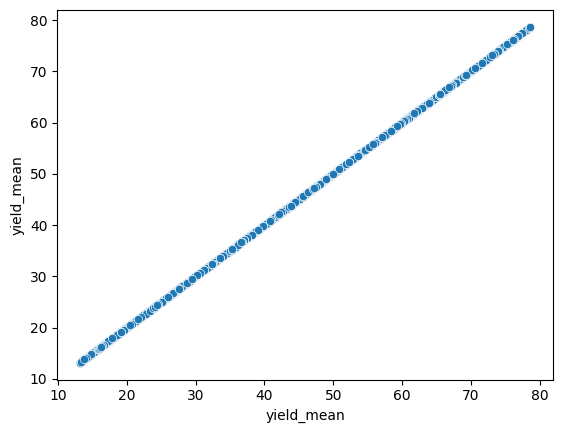

#############################################################################
year


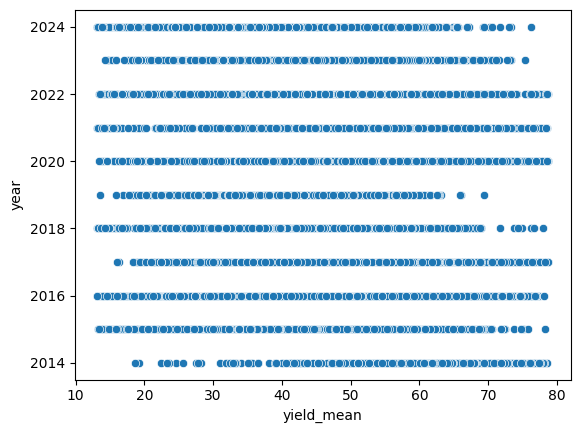

#############################################################################
field


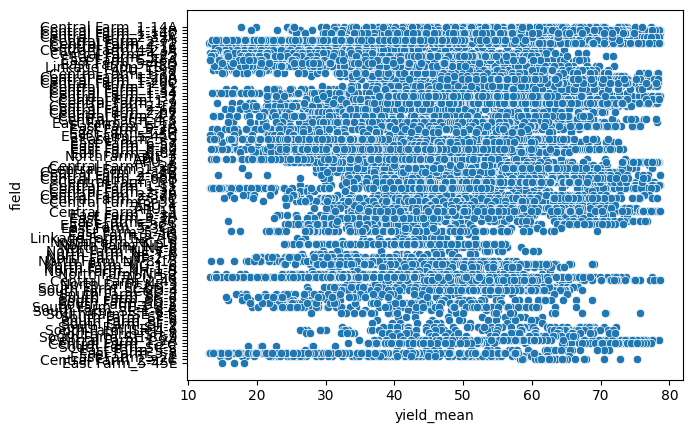

#############################################################################


In [13]:
for key in df.keys():
  print(key)
  sns.scatterplot(data=df, x='yield_mean', y=key)
  plt.show()
  print("#############################################################################")


In [12]:
import numpy as np

YIELD_COL = "yield_mean"
TAIL = 0.02  # 2% tails

EXCLUDE_COLS = {
    'year', 'field', YIELD_COL
}

# -------------------------
# Step 1) Trim extreme 2% of yield (both tails)
# -------------------------
y_lo = df[YIELD_COL].quantile(TAIL)
y_hi = df[YIELD_COL].quantile(1 - TAIL)

mask_yield_ok = df[YIELD_COL].between(y_lo, y_hi)
df = df.loc[mask_yield_ok].copy()

# -------------------------
# Step 2) One-shot trim extremes (2% tails) for ALL numeric features
# -------------------------
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
feature_cols = [
    "GI_max", "GI_mean", "GI_range",
    "NDVI_max", "NDVI_mean", "NDVI_range",
    # 'Soil_Alpha',
    #    'Soil_BD', 'Soil_Clay', 'Soil_Ksat', 'Soil_Lambda', 'Soil_N', 'Soil_OM',
    #    'Soil_Sand', 'Soil_Silt', 'Soil_Theta_R', 'Soil_Theta_S', 'Soil_pH',
       'Tr_SWIR1_max', 'Tr_SWIR1_mean', 'Tr_SWIR1_range', 'Tr_SWIR2_max',
       'Tr_SWIR2_mean', 'Tr_SWIR2_range',
]

feature_cols = ['elevation', 'Tr_SWIR1_max', 'Tr_SWIR1_mean', 'Tr_SWIR1_range', 'Tr_SWIR2_max',  'Tr_SWIR2_mean', 'Tr_SWIR2_range',]

# If you want to ignore columns with all-NaN or near-constant behavior:
feature_cols = [c for c in feature_cols if df[c].notna().any()]

q_low  = df[feature_cols].quantile(TAIL)
q_high = df[feature_cols].quantile(1 - TAIL)

low_extreme  = df[feature_cols].lt(q_low, axis="columns")
high_extreme = df[feature_cols].gt(q_high, axis="columns")

# (Optional but recommended) treat NaN in any feature as "bad row"
any_missing = df[feature_cols].isna().any(axis=1)

any_extreme = (low_extreme | high_extreme).any(axis=1)

df = df.loc[~(any_extreme | any_missing)].copy()

print("df updated.")
print("Final rows:", len(df))
print("Removed due to extremes:", int(any_extreme.sum()))
print("Removed due to missing:", int(any_missing.sum()))


df updated.
Final rows: 19049
Removed due to extremes: 3698
Removed due to missing: 4


In [8]:
# Build a Correlation Heatmap for all the variables
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

corr_features = [
    'yield_mean',
    'EVI_max', 'EVI_mean', 'EVI_range', 'GI_max', 'GI_mean',
       'GI_range', 'LST_max', 'LST_median', 'LST_range', 'NDVI_max',
       'NDVI_mean', 'NDVI_range', 'NDWI_max', 'NDWI_mean', 'NDWI_range',
       'Precip_Max_mm', 'Precip_Mean_mm', 'Precip_Total_mm', 'Soil_Alpha',
       'Soil_BD', 'Soil_Clay', 'Soil_Ksat', 'Soil_Lambda', 'Soil_N', 'Soil_OM',
       'Soil_Sand', 'Soil_Silt', 'Soil_Theta_R', 'Soil_Theta_S', 'Soil_pH',
       'Tr_SWIR1_max', 'Tr_SWIR1_mean', 'Tr_SWIR1_range', 'Tr_SWIR2_max',
       'Tr_SWIR2_mean', 'Tr_SWIR2_range',  'elevation', 'slope', 'aspect',

                 ]


# ── select only those columns from the dataframe ─────────────────
df_features = df[corr_features]

# ── compute correlation matrix ───────────────────────────────────
corr_matrix = df_features.corr()

# ── print raw numbers ────────────────────────────────────────────
print(corr_matrix)

# ── plot heatmap ─────────────────────────────────────────────────
plt.figure(figsize=(25, 25))
sns.heatmap(
    corr_matrix,
    annot=True,        # show correlation values
    cmap="coolwarm",   # color scheme
    fmt=".2f",         # format decimals
    linewidths=0.5
)
plt.title("Feature Correlation Matrix (2014–2024) For Corn", fontsize=14)
plt.show()


AttributeError: 'DataFrame' object has no attribute 'leys'

In [26]:
df.keys()

Index(['EVI_max', 'EVI_mean', 'EVI_range', 'GI_max', 'GI_mean', 'GI_range',
       'LST_max', 'LST_median', 'LST_range', 'NDVI_max', 'NDVI_mean',
       'NDVI_range', 'NDWI_max', 'NDWI_mean', 'NDWI_range', 'Precip_Max_mm',
       'Precip_Mean_mm', 'Precip_Total_mm', 'Soil_Alpha', 'Soil_BD',
       'Soil_Clay', 'Soil_Ksat', 'Soil_Lambda', 'Soil_N', 'Soil_OM',
       'Soil_Sand', 'Soil_Silt', 'Soil_Theta_R', 'Soil_Theta_S', 'Soil_pH',
       'Tr_SWIR1_max', 'Tr_SWIR1_mean', 'Tr_SWIR1_range', 'Tr_SWIR2_max',
       'Tr_SWIR2_mean', 'Tr_SWIR2_range', 'elevation', 'slope', 'aspect',
       'yield_mean', 'year', 'field'],
      dtype='object')

In [93]:
import numpy as np
import pandas as pd

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor

from sklearn.model_selection import GroupKFold, RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# =========================
# USER SETTINGS
# =========================
TARGET = "yield_mean"

features = [
    'EVI_max', 'EVI_mean', 'EVI_range', 'GI_max', 'GI_mean', 'GI_range',
       'LST_max', 'LST_median', 'LST_range', 'NDVI_max', 'NDVI_mean',
       'NDVI_range', 'NDWI_max', 'NDWI_mean', 'NDWI_range', 'Precip_Max_mm',
       'Precip_Mean_mm', 'Precip_Total_mm',
]

train_years = [
    2015, 2016, 2018, 2020, 2021, 2022
]

val_years = [
    2019, 2023, 2024
]

test_year = 2017


# =========================
# 0) Basic checks
# =========================
assert "year" in df_corn.columns, "df_corn must contain a 'year' column."
assert TARGET in df_corn.columns, f"Missing target column: {TARGET}"
missing_feats = [c for c in features if c not in df_corn.columns]
assert len(missing_feats) == 0, f"Missing feature columns in df_corn: {missing_feats}"

df = df_corn.copy()
df["year"] = pd.to_numeric(df["year"], errors="coerce").astype("Int64")
df = df.dropna(subset=["year", TARGET]).copy()
df["year"] = df["year"].astype(int)

# =========================
# 1) Split by years
# =========================
train_df = df[df["year"].isin(train_years)].copy()
val_df   = df[df["year"].isin(val_years)].copy()
test_df  = df[df["year"] == test_year].copy()

print("Rows:")
print("  train:", len(train_df), "years:", sorted(train_df["year"].unique()))
print("  val  :", len(val_df),   "years:", sorted(val_df["year"].unique()))
print("  test :", len(test_df),  "years:", sorted(test_df["year"].unique()))

assert len(train_df) > 0 and len(val_df) > 0 and len(test_df) > 0, "One split is empty—check your year lists."

X_train, y_train = train_df[features], train_df[TARGET]
X_val,   y_val   = val_df[features],   val_df[TARGET]
X_test,  y_test  = test_df[features],  test_df[TARGET]

# =========================
# 2) Preprocess (IMPUTE + STANDARDIZE)
#    Fit ONLY on training (pipeline prevents leakage)
# =========================
numeric_features = features

preprocess = ColumnTransformer(
    transformers=[
        ("num", Pipeline(steps=[
            ("imputer", SimpleImputer(strategy="median")),
            ("scaler", StandardScaler()),
        ]), numeric_features)
    ],
    remainder="drop"
)

# =========================
# 3) Model + Hyperparameter tuning on TRAIN only
#    GroupKFold by year (prevents mixing years inside CV folds)
# =========================
rf = RandomForestRegressor(
    random_state=42,
    n_jobs=1
)

pipe = Pipeline(steps=[
    ("prep", preprocess),
    ("model", rf)
])

param_dist = {
    "model__n_estimators": [300, 500, 800, 1000],
    "model__max_depth": [None, 10, 20, 30, 50],
    "model__min_samples_split": [2, 5, 10, 20],
    "model__min_samples_leaf": [1, 2, 4, 8],
    "model__max_features": ["sqrt", "log2", 0.3, 0.5, 0.8],
    "model__bootstrap": [True, False],
}

groups = train_df["year"].to_numpy()
cv = GroupKFold(n_splits=min(5, len(np.unique(groups))))  # safe if few years

search = RandomizedSearchCV(
    estimator=pipe,
    param_distributions=param_dist,
    n_iter=30,
    scoring="neg_root_mean_squared_error",
    cv=cv,
    verbose=2,
    random_state=42,
    n_jobs=1
)

search.fit(X_train, y_train, **{"model__sample_weight": None}, groups=groups)

best_model = search.best_estimator_
print("\nBest params:", search.best_params_)
print("Best CV RMSE:", -search.best_score_)

# =========================
# 4) Evaluate on VAL and TEST (2023)
# =========================
def eval_split(name, model, X, y):
    pred = model.predict(X)
    # mae = mean_absolute_error(y, pred, squared=False)
    mae  = mean_absolute_error(y, pred)
    r2   = r2_score(y, pred)
    corr, _ = np.corrcoef(y, pred)
    corr_sq = corr**2
    print(f"\n[{name}]")
    # print("  RMSE:", rmse)
    print("  MAE :", mae)
    print("  R^2 :", r2)
    print("  Corr:", corr)
    print("  Corr²:", corr_sq)
    return pred, { "mae": mae, "r2": r2, "Corr_sq:": corr_sq}

_ = eval_split("VALIDATION", best_model, X_val, y_val)
_ = eval_split(f"TEST ({test_year})", best_model, X_test, y_test)

# =========================
# 5) Feature importance (after preprocessing)
# =========================
rf_fitted = best_model.named_steps["model"]
importances = rf_fitted.feature_importances_

fi = pd.DataFrame({
    "feature": features,
    "importance": importances
}).sort_values("importance", ascending=False)

print("\nTop feature importances:")
print(fi.head(20))


[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=0.5, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=300; total time=  20.3s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=0.5, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=300; total time=  18.5s
[CV] END model__bootstrap=True, model__max_depth=10, model__max_features=0.3, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=1000; total time=  27.2s
[CV] END model__bootstrap=True, model__max_depth=10, model__max_features=0.3, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=1000; total time=  29.2s
[CV] END model__bootstrap=True, model__max_depth=10, model__max_features=0.3, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=1000; total time=  31.5s
[CV] END model__bootstrap=True, model__max_depth=10, model__max_features=0.3, model__min_samples_leaf=1, mode

Starting Leave-One-Year-Out Validation with Standardization...


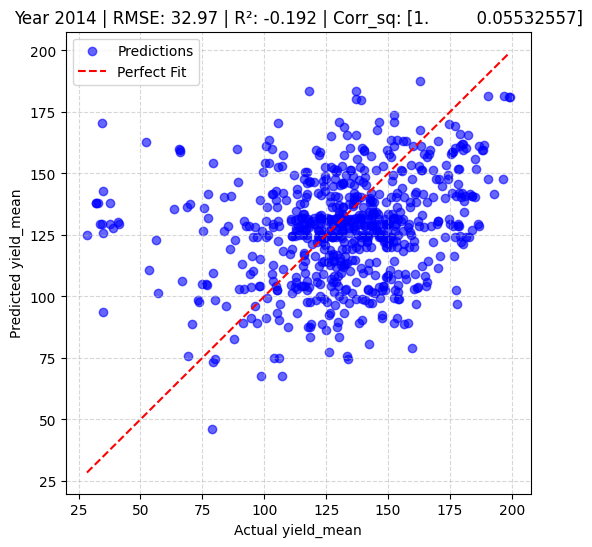

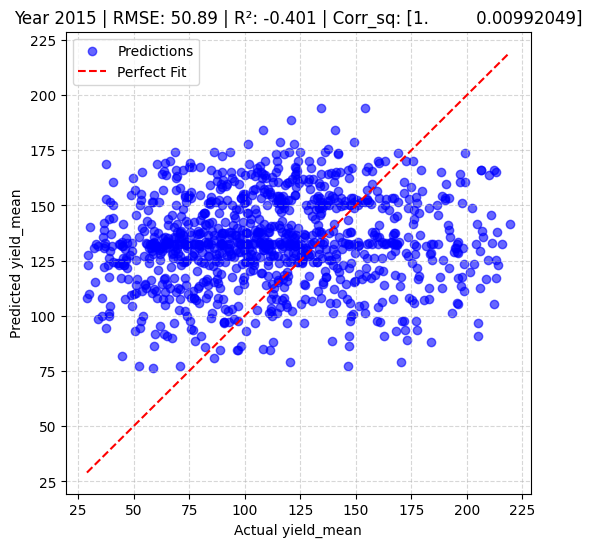

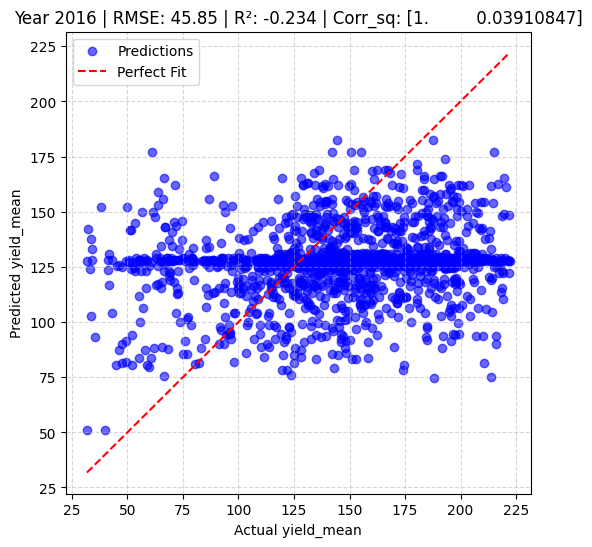

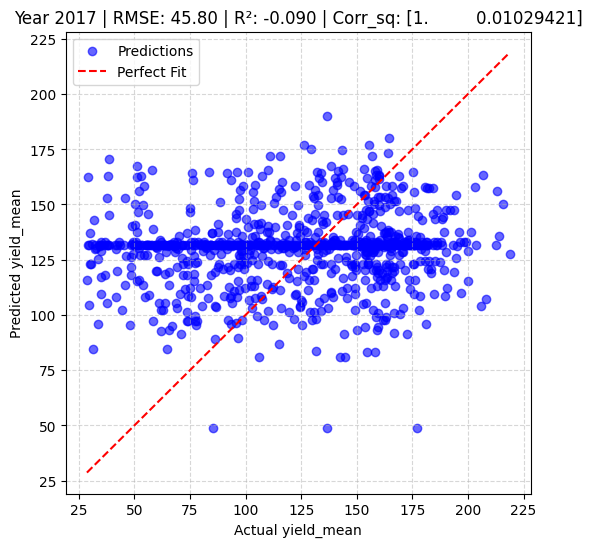

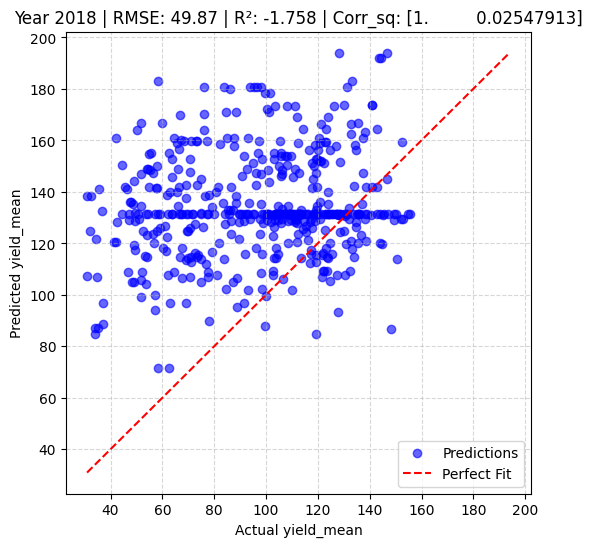

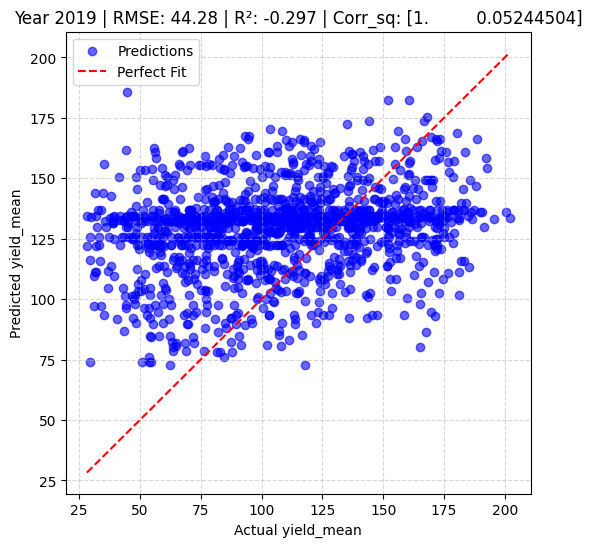

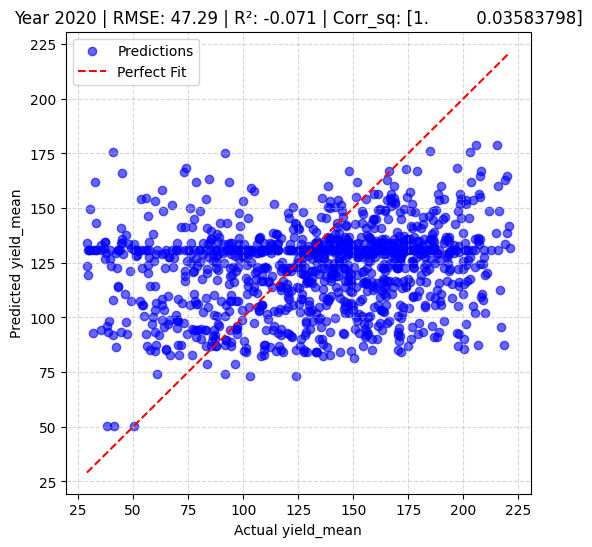

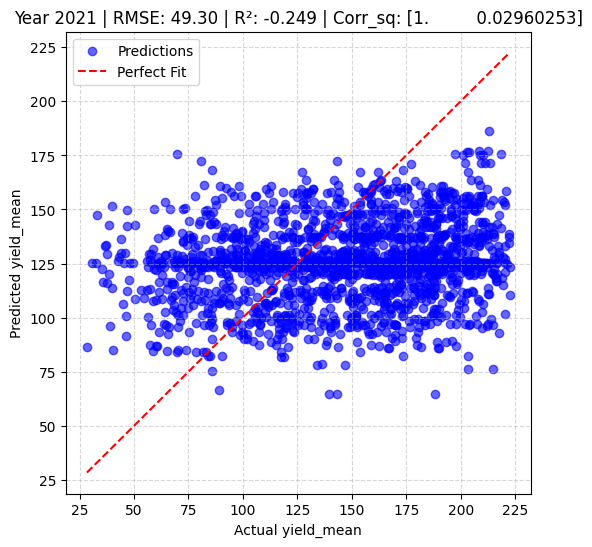

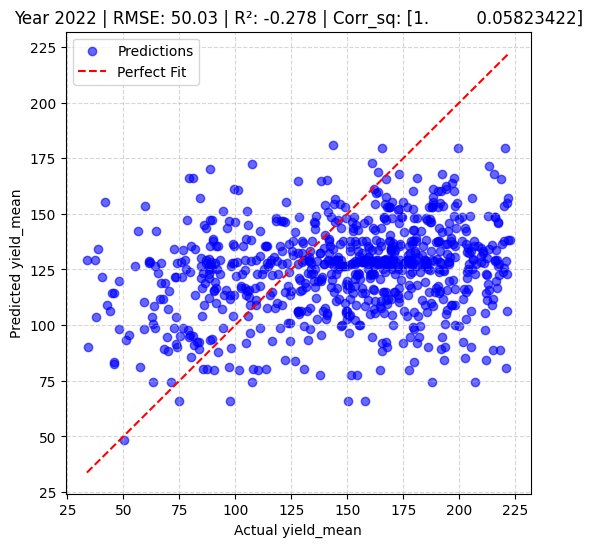

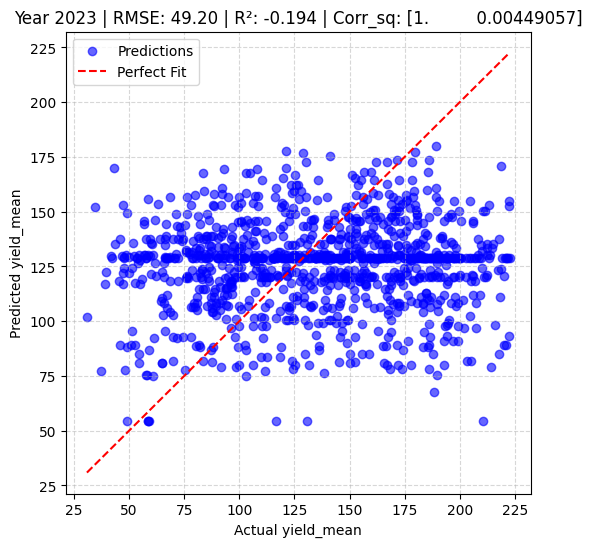

------------------------------
Average RMSE: 46.55
Average R2: -0.376


In [95]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

# 1. Define your hyperparameters
rf_params = {
'n_estimators': 300, 'min_samples_split': 20, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'max_depth': 20, 'bootstrap': False
}

target_col = "yield_mean"

features = [
    'EVI_max', 'EVI_mean', 'EVI_range', 'GI_max', 'GI_mean', 'GI_range',
       'LST_max', 'LST_median', 'LST_range', 'NDVI_max', 'NDVI_mean',
       'NDVI_range', 'NDWI_max', 'NDWI_mean', 'NDWI_range', 'Precip_Max_mm',
       'Precip_Mean_mm', 'Precip_Total_mm',
]

results = []
years_range = range(2014, 2024)

print(f"Starting Leave-One-Year-Out Validation with Standardization...")
for test_year in years_range:
    # --- A. Split Data ---
    test_df = df[df['year'] == test_year]
    train_df = df[df['year'] != test_year]

    X_train = train_df[feature_cols].copy()
    y_train = train_df[target_col]
    X_test = test_df[feature_cols].copy()
    y_test = test_df[target_col]

    # --- B. Standardize ---
    scaler = StandardScaler()
    scaler.fit(X_train)
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # --- C. Train and Predict ---
    model = RandomForestRegressor(**rf_params)
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)

    # --- D. Evaluate ---
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    corr, _ = np.corrcoef(y_test, y_pred)
    corr_sq = corr**2

    # --- E. Plotting ---
    plt.figure(figsize=(6, 6))

    # Scatter plot of points
    plt.scatter(y_test, y_pred, alpha=0.6, color='blue', label='Predictions')

    # Perfect prediction line (y=x)
    # We find the min and max to draw the line across the whole range
    min_val = min(y_test.min(), y_pred.min())
    max_val = max(y_test.max(), y_pred.max())
    plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='Perfect Fit')

    plt.title(f"Year {test_year} | RMSE: {rmse:.2f} | R²: {r2:.3f} | Corr_sq: {corr_sq}")
    plt.xlabel(f"Actual {target_col}")
    plt.ylabel(f"Predicted {target_col}")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.show() # Renders the plot immediately

    # Store results
    results.append({'Test_Year': test_year, 'RMSE': rmse, 'R2': r2, "Corr_sq": corr_sq})

# --- Final Summary ---
avg_rmse = np.mean([res['RMSE'] for res in results])
avg_r2 = np.mean([res['R2'] for res in results])

print("-" * 30)
print(f"Average RMSE: {avg_rmse:.2f}")
print(f"Average R2: {avg_r2:.3f}")

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GroupKFold, RandomizedSearchCV, learning_curve
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# =========================
# 1. SETUP & DATA MERGING
# =========================
TARGET = "yield_mean"
features = [
    'EVI_max', 'EVI_mean', 'EVI_range', 'GI_max', 'GI_mean', 'GI_range',
       'LST_max', 'LST_median', 'LST_range', 'NDVI_max', 'NDVI_mean',
       'NDVI_range', 'NDWI_max', 'NDWI_mean', 'NDWI_range', 'Precip_Max_mm',
       'Precip_Mean_mm', 'Precip_Total_mm',
]

# COMBINE Train + Validation for maximum learning
train_val_years = [2015, 2016, 2018, 2020, 2021, 2022, 2019, 2023, 2024]
test_year = 2017

# Load & Clean
# (Assuming df_corn is already loaded in your environment)
df = df_corn.copy()
df["year"] = pd.to_numeric(df["year"], errors="coerce").astype("Int64")
df = df.dropna(subset=["year", TARGET]).copy()
df["year"] = df["year"].astype(int)

# Split
train_df = df[df["year"].isin(train_val_years)].copy()
test_df  = df[df["year"] == test_year].copy()

X_train, y_train = train_df[features], train_df[TARGET]
X_test,  y_test  = test_df[features],  test_df[TARGET]
groups = train_df["year"].to_numpy()

print(f"Training Rows: {len(X_train)} (9 Years)")
print(f"Testing Rows : {len(X_test)} (Year {test_year})")

# =========================
# 2. INTENSE HYPERPARAMETER TUNING
# =========================
preprocess = ColumnTransformer(
    transformers=[("num", Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler())
    ]), features)], remainder="drop"
)

rf_pipe = Pipeline([
    ("prep", preprocess),
    ("model", RandomForestRegressor(random_state=42, n_jobs=1))
])

# Intense Grid
param_dist = {
    "model__n_estimators": [300, 500, 800, 1000, 1200],
    "model__max_depth": [10, 20, 30, 40, None],
    "model__min_samples_split": [2, 5, 8, 12],
    "model__min_samples_leaf": [1, 2, 4, 6],
    "model__max_features": ["sqrt", "log2", 0.3, 0.5],
    "model__bootstrap": [True] # Keep True for speed/OOB potential
}

# Leave-One-Year-Out CV
n_years = len(np.unique(groups))
cv = GroupKFold(n_splits=n_years)

print("\nStarting Intense Search (n_iter=50)... this may take time...")
search = RandomizedSearchCV(
    rf_pipe, param_dist,
    n_iter=50,
    cv=cv,
    scoring="neg_root_mean_squared_error",
    n_jobs=1, # USER REQUESTED
    verbose=1,
    random_state=42
)

search.fit(X_train, y_train, groups=groups)

print("\nBest Params:", search.best_params_)
print("Best CV RMSE:", -search.best_score_)

# =========================
# 3. FINAL EVALUATION
# =========================
best_model = search.best_estimator_
y_pred = best_model.predict(X_test)

rmse = mean_squared_error(y_test, y_pred, squared=False)
mae  = mean_absolute_error(y_test, y_pred)
r2   = r2_score(y_test, y_pred)
corr, _ = pearsonr(y_test, y_pred)
corr_sq = corr**2

print(f"\n[FINAL TEST RESULTS ({test_year})]")
print(f"  RMSE    : {rmse:.4f}")
print(f"  MAE     : {mae:.4f}")
print(f"  R²      : {r2:.4f}")
print(f"  Corr²   : {corr_sq:.4f}")

# =========================
# 4. COMPREHENSIVE VISUALIZATION
# =========================
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(18, 12))
plt.suptitle(f"Random Forest Performance Analysis", fontsize=16)

# --- A) Prediction Scatter ---
axes[0,0].scatter(y_test, y_pred, alpha=0.6, color='tab:blue', edgecolor='k')
min_val, max_val = min(y_test.min(), y_pred.min()), max(y_test.max(), y_pred.max())
axes[0,0].plot([min_val, max_val], [min_val, max_val], 'r--', lw=2)
axes[0,0].set_title(f"Predicted vs Actual (R²={r2:.3f})")
axes[0,0].set_xlabel("Actual Yield")
axes[0,0].set_ylabel("Predicted Yield")

# --- B) Residual Plot ---
residuals = y_test - y_pred
axes[0,1].scatter(y_pred, residuals, alpha=0.6, color='tab:purple', edgecolor='k')
axes[0,1].axhline(0, color='r', linestyle='--')
axes[0,1].set_title("Residuals vs Predicted")
axes[0,1].set_xlabel("Predicted Yield")
axes[0,1].set_ylabel("Error (Residual)")

# --- C) Feature Importance ---
rf_fitted = best_model.named_steps["model"]
importances = rf_fitted.feature_importances_
fi_df = pd.DataFrame({"feature": features, "importance": importances}).sort_values("importance", ascending=False)
sns.barplot(data=fi_df.head(10), x="importance", y="feature", ax=axes[1,0], palette="viridis")
axes[1,0].set_title("Top 10 Feature Importances")

# --- D) Learning Curve (Sample Size) ---
# Checks Bias vs Variance
print("Generating Learning Curve...")
train_sizes, train_scores, test_scores = learning_curve(
    best_model, X_train, y_train, cv=cv, groups=groups,
    scoring='neg_root_mean_squared_error', n_jobs=1,
    train_sizes=np.linspace(0.1, 1.0, 5)
)
train_mean = -np.mean(train_scores, axis=1)
test_mean  = -np.mean(test_scores, axis=1)

axes[1,1].plot(train_sizes, train_mean, 'o-', label="Training Error")
axes[1,1].plot(train_sizes, test_mean, 'o-', label="CV Error")
axes[1,1].set_title("Learning Curve (Bias vs Variance)")
axes[1,1].set_xlabel("Training Set Size")
axes[1,1].set_ylabel("RMSE")
axes[1,1].legend()

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# =========================
# 5. SPECIAL: "OOB" CONVERGENCE CURVE (Manual Loop)
# =========================
# Random Forest doesn't output error-per-tree automatically like XGBoost.
# We must manually build it to check if 500/1000 trees is enough.
print("\nGenerating Random Forest Convergence Curve (Error vs Trees)...")

# Get best params but remove n_estimators (we will vary it)
best_params = search.best_params_.copy()
del best_params['model__n_estimators']
# Strip 'model__' prefix for direct RF usage
best_rf_params = {k.replace('model__', ''): v for k, v in best_params.items()}

# Preprocess data once
X_train_tr = preprocess.fit_transform(X_train)
X_test_tr  = preprocess.transform(X_test)

# Define Tree steps to check
tree_counts = [10, 50, 100, 200, 400, 600, 800, 1000, 1200]
train_errs = []
test_errs  = []

for n in tree_counts:
    # Warm Start = False ensures we train a fresh forest each time
    # (slower but more accurate for this specific test)
    rf_temp = RandomForestRegressor(
        n_estimators=n,
        n_jobs=1,
        random_state=42,
        **best_rf_params
    )
    rf_temp.fit(X_train_tr, y_train)

    # Train Error
    tr_pred = rf_temp.predict(X_train_tr)
    train_errs.append(mean_squared_error(y_train, tr_pred, squared=False))

    # Test Error
    te_pred = rf_temp.predict(X_test_tr)
    test_errs.append(mean_squared_error(y_test, te_pred, squared=False))
    print(f"  Trees: {n:4d} | Test RMSE: {test_errs[-1]:.4f}")

# Plot Convergence
plt.figure(figsize=(10, 6))
plt.plot(tree_counts, train_errs, 'o-', label="Training RMSE")
plt.plot(tree_counts, test_errs, 'o-', label="Test RMSE (2017)")
plt.title("Random Forest Convergence (Error vs Number of Trees)")
plt.xlabel("Number of Trees")
plt.ylabel("RMSE")
plt.legend()
plt.grid(True)
plt.show()

### Build, Hypertime, Evaluate, Test Random Forest and XGBoost Models

Training Rows: 17238 | Test Rows: 1424

STARTING RANDOM FOREST (INTENSE TUNING)
Fitting 9 folds for each of 150 candidates, totalling 1350 fits
[CV] END model__bootstrap=True, model__max_depth=7, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=9, model__n_estimators=500; total time=   9.1s
[CV] END model__bootstrap=False, model__max_depth=7, model__max_features=sqrt, model__min_samples_leaf=4, model__min_samples_split=7, model__n_estimators=500; total time=  16.7s
[CV] END model__bootstrap=True, model__max_depth=6, model__max_features=0.5, model__min_samples_leaf=4, model__min_samples_split=7, model__n_estimators=900; total time=  41.0s
[CV] END model__bootstrap=False, model__max_depth=9, model__max_features=log2, model__min_samples_leaf=2, model__min_samples_split=7, model__n_estimators=1000; total time=  49.9s
[CV] END model__bootstrap=False, model__max_depth=20, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=9, model__n_es

/home/cholab/LabMembers/Samar/.venv/lib/python3.10/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV] END model__bootstrap=True, model__max_depth=7, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=9, model__n_estimators=500; total time=  13.3s
[CV] END model__bootstrap=True, model__max_depth=8, model__max_features=0.33, model__min_samples_leaf=1, model__min_samples_split=7, model__n_estimators=800; total time=  29.7s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=0.75, model__min_samples_leaf=2, model__min_samples_split=10, model__n_estimators=500; total time= 1.5min
[CV] END model__bootstrap=False, model__max_depth=2, model__max_features=0.5, model__min_samples_leaf=1, model__min_samples_split=7, model__n_estimators=1200; total time=  31.3s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=0.75, model__min_samples_leaf=2, model__min_samples_split=10, model__n_estimators=200; total time=  37.9s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=0.5, model__min_samples_leaf=4,

/tmp/ipykernel_919722/919413902.py:101: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=feat_df, x='Importance', y='Feature', ax=axes[1,0], palette='viridis')


[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=900; total time=  38.8s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=0.33, model__min_samples_leaf=2, model__min_samples_split=5, model__n_estimators=1000; total time= 1.4min
[CV] END model__bootstrap=True, model__max_depth=2, model__max_features=0.33, model__min_samples_leaf=2, model__min_samples_split=5, model__n_estimators=600; total time=  12.3s
[CV] END model__bootstrap=True, model__max_depth=5, model__max_features=log2, model__min_samples_leaf=4, model__min_samples_split=10, model__n_estimators=600; total time=  15.9s
[CV] END model__bootstrap=True, model__max_depth=10, model__max_features=sqrt, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=500; total time=  20.7s
[CV] END model__bootstrap=False, model__max_depth=3, model__max_features=log2, model__min_samples_leaf=4,

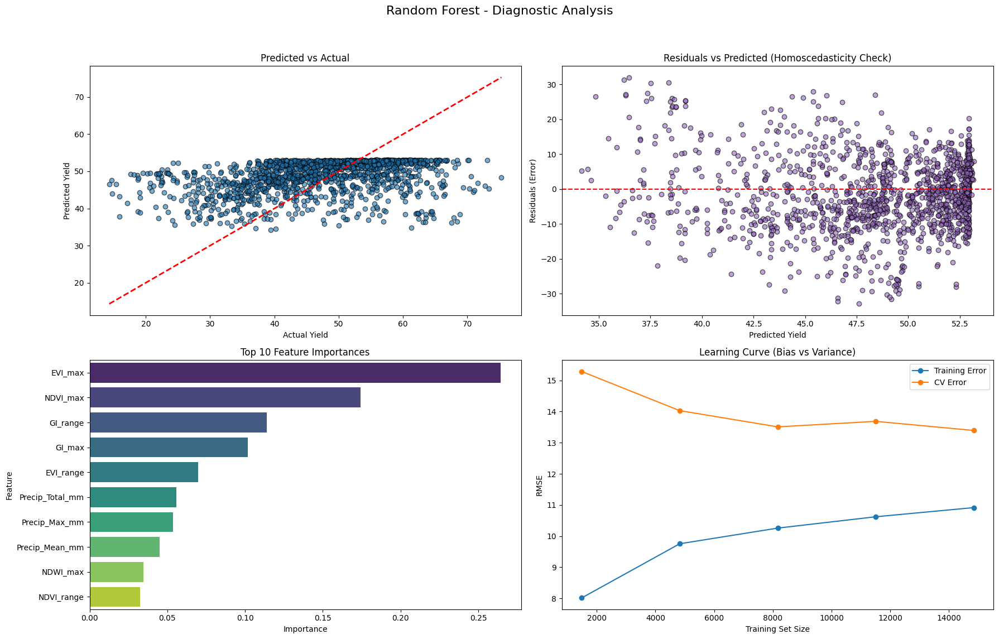


STARTING XGBOOST (INTENSE TUNING)
Fitting 9 folds for each of 150 candidates, totalling 1350 fits
[CV] END model__colsample_bytree=0.6, model__gamma=0.1, model__learning_rate=0.05, model__max_depth=4, model__n_estimators=500, model__reg_alpha=0, model__reg_lambda=1, model__subsample=0.9; total time=  10.4s
[CV] END model__colsample_bytree=0.8, model__gamma=0.5, model__learning_rate=0.01, model__max_depth=8, model__n_estimators=900, model__reg_alpha=0.01, model__reg_lambda=1.5, model__subsample=0.8; total time=  12.5s
[CV] END model__colsample_bytree=0.6, model__gamma=0, model__learning_rate=0.01, model__max_depth=6, model__n_estimators=1200, model__reg_alpha=0.1, model__reg_lambda=1.5, model__subsample=0.9; total time=   7.2s
[CV] END model__colsample_bytree=0.6, model__gamma=0.5, model__learning_rate=0.05, model__max_depth=4, model__n_estimators=1200, model__reg_alpha=0.1, model__reg_lambda=1, model__subsample=0.8; total time=   2.3s
[CV] END model__colsample_bytree=0.6, model__gamma

/tmp/ipykernel_919722/919413902.py:101: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=feat_df, x='Importance', y='Feature', ax=axes[1,0], palette='viridis')


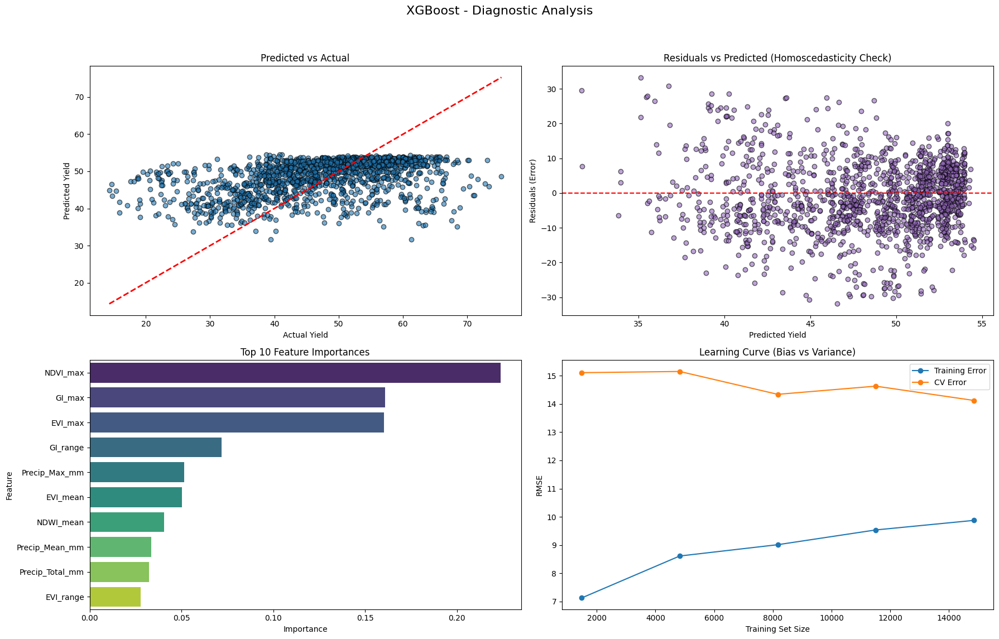


Generating Detailed XGBoost Iteration Curve...


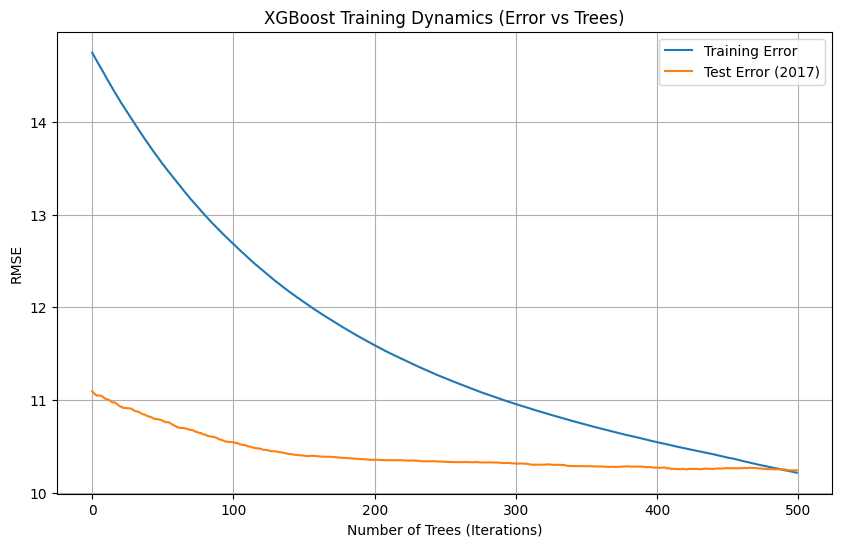


=== FINAL PERFORMANCE SUMMARY ===
                    mae        r2   corr_sq
Random Forest  8.247087  0.102689  0.122933
XGBoost        7.967496  0.149040  0.162248
Parameters:
Random Forest: {'model__n_estimators': 200, 'model__min_samples_split': 5, 'model__min_samples_leaf': 1, 'model__max_features': 'sqrt', 'model__max_depth': 3, 'model__bootstrap': True}
XGBoost: {'model__subsample': 0.9, 'model__reg_lambda': 3, 'model__reg_alpha': 1, 'model__n_estimators': 500, 'model__max_depth': 3, 'model__learning_rate': 0.005, 'model__gamma': 0.5, 'model__colsample_bytree': 0.7}


In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from scipy.stats import pearsonr

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

from sklearn.model_selection import GroupKFold, RandomizedSearchCV, learning_curve
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# =========================
# 1. SETUP & DATA
# =========================
TARGET = "yield_mean"
features = [
    'EVI_max', 'EVI_mean', 'EVI_range', 'GI_max', 'GI_mean', 'GI_range',
       'LST_max', 'LST_median', 'LST_range', 'NDVI_max', 'NDVI_mean',
       'NDVI_range', 'NDWI_max', 'NDWI_mean', 'NDWI_range', 'Precip_Max_mm',
       'Precip_Mean_mm', 'Precip_Total_mm',
]

# COMBINE Train + Validation for maximum power
train_val_years = [2015, 2016, 2018, 2020, 2021, 2022, 2019, 2017, 2024]
test_year = 2023

# Load & Clean (Assuming df exists)
df = df.copy()
df["year"] = pd.to_numeric(df["year"], errors="coerce").astype("Int64")
df = df.dropna(subset=["year", TARGET]).copy()
df["year"] = df["year"].astype(int)

train_df = df[df["year"].isin(train_val_years)].copy()
test_df  = df[df["year"] == test_year].copy()

X_train, y_train = train_df[features], train_df[TARGET]
X_test,  y_test  = test_df[features],  test_df[TARGET]
groups = train_df["year"].to_numpy() # For GroupCV

print(f"Training Rows: {len(X_train)} | Test Rows: {len(X_test)}")

# =========================
# 2. HELPER FUNCTIONS (Metrics & Plots)
# =========================
def get_detailed_metrics(y_true, y_pred, name="Model"):
    # rmse = mean_squared_error(y_true, y_pred, squared=False)
    mae  = mean_absolute_error(y_true, y_pred)
    r2   = r2_score(y_true, y_pred)

    # Squared Pearson Correlation
    corr, _ = pearsonr(y_true, y_pred)
    corr_sq = corr ** 2

    print(f"\n--- {name} Results (Test Year {test_year}) ---")
    # print(f"  RMSE     : {rmse:.4f}")
    print(f"  MAE      : {mae:.4f}")
    print(f"  R² Score : {r2:.4f}")
    print(f"  Corr²    : {corr_sq:.4f}")

    return { "mae": mae, "r2": r2, "corr_sq": corr_sq}

def plot_diagnostics(model, X_train, y_train, X_test, y_test, model_name):
    """Generates a 2x2 dashboard of diagnostic curves."""
    fig, axes = plt.subplots(2, 2, figsize=(18, 12))
    plt.suptitle(f"{model_name} - Diagnostic Analysis", fontsize=16)

    # A) Prediction Scatter
    y_pred = model.predict(X_test)
    axes[0,0].scatter(y_test, y_pred, alpha=0.6, color='tab:blue', edgecolor='k')
    min_val, max_val = min(y_test.min(), y_pred.min()), max(y_test.max(), y_pred.max())
    axes[0,0].plot([min_val, max_val], [min_val, max_val], 'r--', lw=2)
    axes[0,0].set_title("Predicted vs Actual")
    axes[0,0].set_xlabel("Actual Yield")
    axes[0,0].set_ylabel("Predicted Yield")

    # B) Residual Plot
    residuals = y_test - y_pred
    axes[0,1].scatter(y_pred, residuals, alpha=0.6, color='tab:purple', edgecolor='k')
    axes[0,1].axhline(0, color='r', linestyle='--')
    axes[0,1].set_title("Residuals vs Predicted (Homoscedasticity Check)")
    axes[0,1].set_xlabel("Predicted Yield")
    axes[0,1].set_ylabel("Residuals (Error)")

    # C) Feature Importance
    # Handle Pipeline nesting
    if hasattr(model, 'best_estimator_'):
        est = model.best_estimator_.named_steps['model']
    else:
        est = model.named_steps['model']

    if hasattr(est, 'feature_importances_'):
        imp = est.feature_importances_
        feat_df = pd.DataFrame({'Feature': features, 'Importance': imp})
        feat_df = feat_df.sort_values('Importance', ascending=False).head(10)
        sns.barplot(data=feat_df, x='Importance', y='Feature', ax=axes[1,0], palette='viridis')
        axes[1,0].set_title("Top 10 Feature Importances")

    # D) Learning Curve (Sample Size)
    # WARNING: Takes time as it retrains model 5 times
    train_sizes, train_scores, test_scores = learning_curve(
        model.best_estimator_ if hasattr(model, 'best_estimator_') else model,
        X_train, y_train, cv=GroupKFold(n_splits=5), groups=groups,
        scoring='neg_root_mean_squared_error', n_jobs=30,
        train_sizes=np.linspace(0.1, 1.0, 5)
    )

    train_mean = -np.mean(train_scores, axis=1)
    test_mean  = -np.mean(test_scores, axis=1)

    axes[1,1].plot(train_sizes, train_mean, 'o-', label="Training Error")
    axes[1,1].plot(train_sizes, test_mean, 'o-', label="CV Error")
    axes[1,1].set_title("Learning Curve (Bias vs Variance)")
    axes[1,1].set_xlabel("Training Set Size")
    axes[1,1].set_ylabel("RMSE")
    axes[1,1].legend()

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Common Preprocessor
preprocess = ColumnTransformer(
    transformers=[("num", Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler())
    ]), features)], remainder="drop"
)

# =========================
# 3. RANDOM FOREST (INTENSE)
# =========================
print("\n" + "="*40)
print("STARTING RANDOM FOREST (INTENSE TUNING)")
print("="*40)

rf_pipe = Pipeline([
    ("prep", preprocess),
    ("model", RandomForestRegressor(random_state=42, n_jobs=30))
])

rf_params = {
    "model__n_estimators": [200, 500,600,700, 800,900, 1000,1200],
    "model__max_depth": [2,3,4,5,6,7,8,9,10, 20, 30, None],
    "model__min_samples_split": [2, 5,7,9, 10],
    "model__min_samples_leaf": [1, 2, 4],
    "model__max_features": ["sqrt", "log2", 0.33,0.5,0.75],
    "model__bootstrap": [True, False]
}

rf_search = RandomizedSearchCV(
    rf_pipe, rf_params,
    n_iter=150, # Intense: 50 combinations
    cv=GroupKFold(n_splits=len(np.unique(groups))), # Leave-One-Year-Out
    scoring="neg_root_mean_squared_error",
    n_jobs=50, verbose=2, random_state=42
)

rf_search.fit(X_train, y_train, groups=groups)
rf_metrics = get_detailed_metrics(y_test, rf_search.predict(X_test), "Random Forest")
plot_diagnostics(rf_search, X_train, y_train, X_test, y_test, "Random Forest")


# =========================
# 4. XGBOOST (INTENSE)
# =========================
print("\n" + "="*40)
print("STARTING XGBOOST (INTENSE TUNING)")
print("="*40)

xgb_pipe = Pipeline([
    ("prep", preprocess),
    ("model", XGBRegressor(random_state=42, n_jobs=30, objective='reg:squarederror'))
])

xgb_params = {
    "model__n_estimators": [300, 500,700,800,900, 1000,1200, 1500],
    "model__learning_rate": [0.001,0.005, 0.01, 0.05, 0.1],
    "model__max_depth": [3, 4, 5, 6, 8],
    "model__subsample": [0.6, 0.7, 0.8, 0.9],
    "model__colsample_bytree": [0.6, 0.7, 0.8],
    "model__gamma": [0, 0.1, 0.5],
    "model__reg_alpha": [0, 0.01, 0.1, 1],
    "model__reg_lambda": [1, 1.5, 3]
}

xgb_search = RandomizedSearchCV(
    xgb_pipe, xgb_params,
    n_iter=150, # Intense: 50 combinations
    cv=GroupKFold(n_splits=len(np.unique(groups))),
    scoring="neg_root_mean_squared_error",
    n_jobs=50, verbose=2, random_state=42
)

xgb_search.fit(X_train, y_train, groups=groups)
xgb_metrics = get_detailed_metrics(y_test, xgb_search.predict(X_test), "XGBoost")
plot_diagnostics(xgb_search, X_train, y_train, X_test, y_test, "XGBoost")


# =========================
# 5. SPECIAL: TRAINING DYNAMICS CURVE (Iteration vs Error)
# =========================
print("\nGenerating Detailed XGBoost Iteration Curve...")

best_xgb_params = {k.replace('model__', ''): v for k, v in xgb_search.best_params_.items()}
X_train_tr = preprocess.fit_transform(X_train)
X_test_tr  = preprocess.transform(X_test)

final_xgb = XGBRegressor(**best_xgb_params, random_state=42, n_jobs=30)
final_xgb.fit(
    X_train_tr, y_train,
    eval_set=[(X_train_tr, y_train), (X_test_tr, y_test)],
    verbose=False
)

results = final_xgb.evals_result()
epochs = len(results['validation_0']['rmse'])
x_axis = range(0, epochs)

plt.figure(figsize=(10, 6))
plt.plot(x_axis, results['validation_0']['rmse'], label='Training Error')
plt.plot(x_axis, results['validation_1']['rmse'], label='Test Error (2017)')
plt.title('XGBoost Training Dynamics (Error vs Trees)')
plt.xlabel('Number of Trees (Iterations)')
plt.ylabel('RMSE')
plt.legend()
plt.grid(True)
plt.show()

# =========================
# 6. FINAL SUMMARY
# =========================
summary = pd.DataFrame([rf_metrics, xgb_metrics], index=["Random Forest", "XGBoost"])
print("\n=== FINAL PERFORMANCE SUMMARY ===")
print(summary)


print("Parameters:")
print("Random Forest:", rf_search.best_params_)
print("XGBoost:", xgb_search.best_params_)

In [16]:
rf_search.best_params_={'model__n_estimators': 200, 'model__min_samples_split': 5, 'model__min_samples_leaf': 1, 'model__max_features': 'sqrt', 'model__max_depth': 3, 'model__bootstrap': True}
xgb_search.best_params_={'model__subsample': 0.9, 'model__reg_lambda': 3, 'model__reg_alpha': 1, 'model__n_estimators': 500, 'model__max_depth': 3, 'model__learning_rate': 0.005, 'model__gamma': 0.5, 'model__colsample_bytree': 0.7}

### Let's Test the hypertuned RF and XGB Models on all the years

Starting Leave-One-Year-Out Validation for years: [np.int64(2014), np.int64(2015), np.int64(2016), np.int64(2017), np.int64(2018), np.int64(2019), np.int64(2020), np.int64(2021), np.int64(2022), np.int64(2023), np.int64(2024)]

Processing Test Year: 2014...


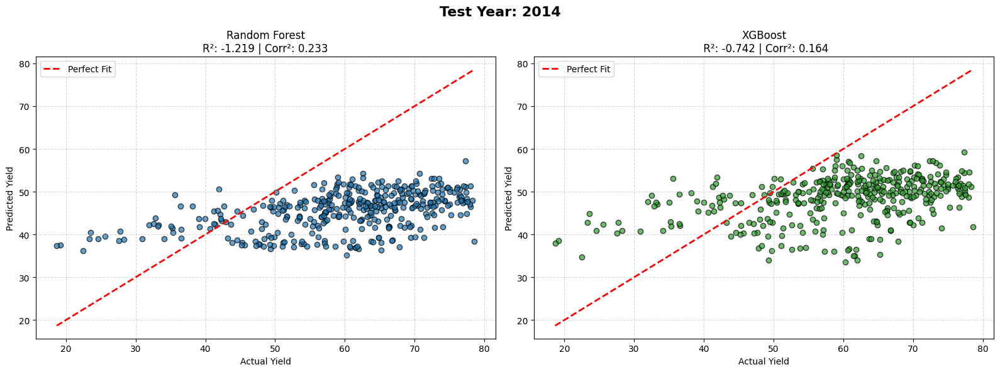


Processing Test Year: 2015...


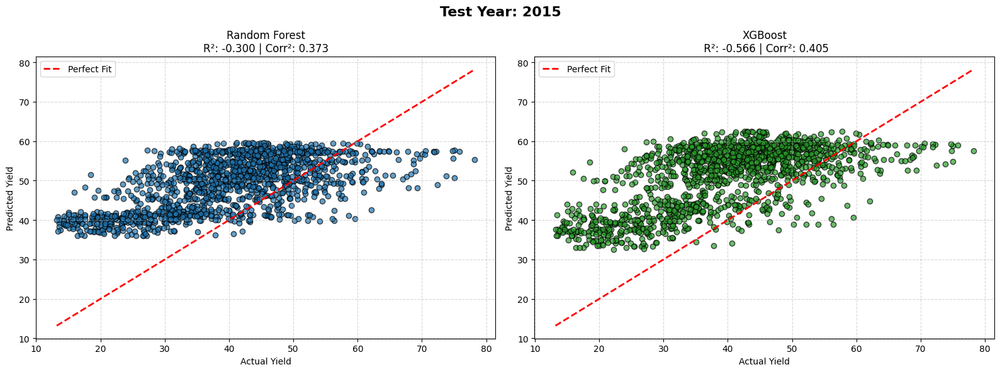


Processing Test Year: 2016...


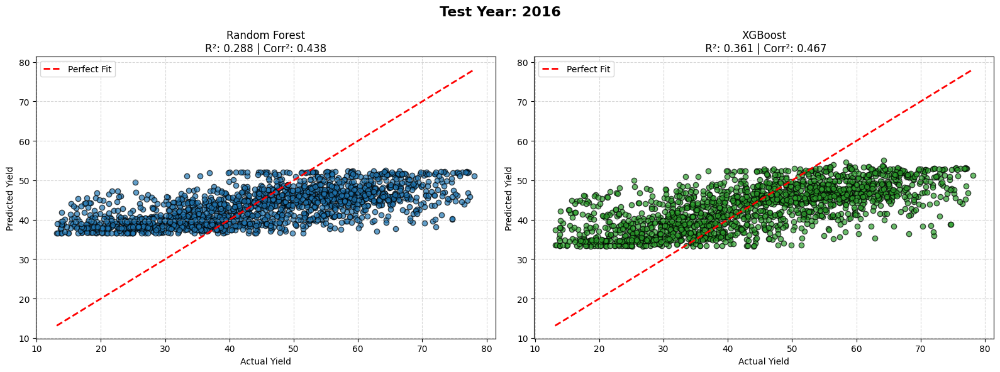


Processing Test Year: 2017...


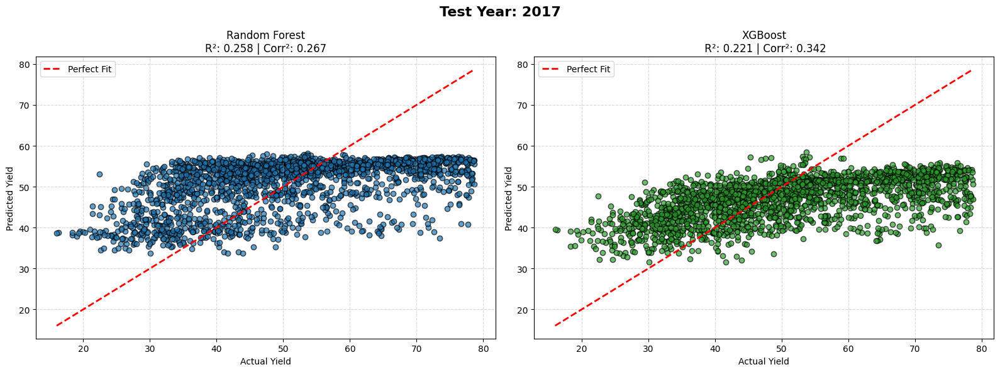


Processing Test Year: 2018...


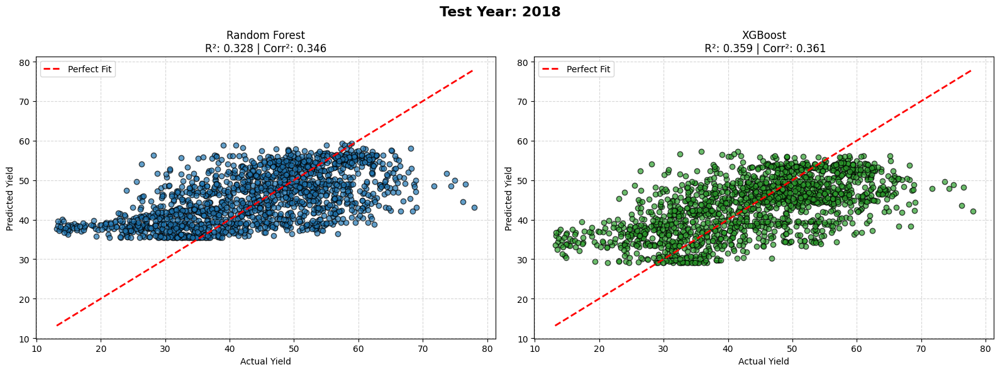


Processing Test Year: 2019...


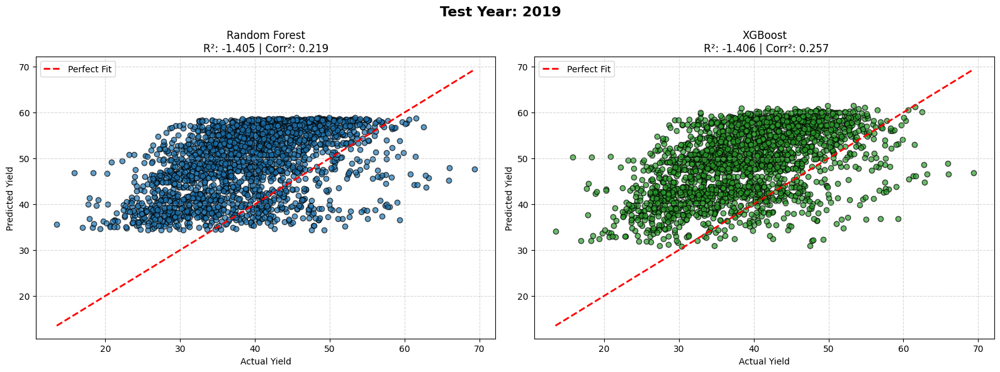


Processing Test Year: 2020...


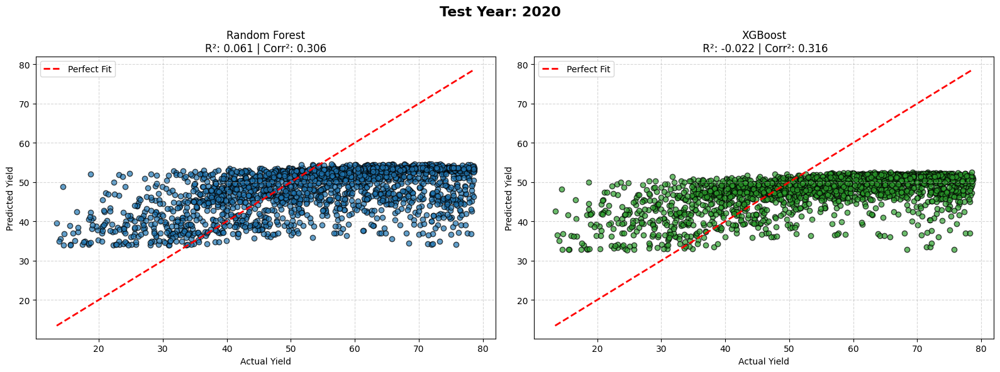


Processing Test Year: 2021...


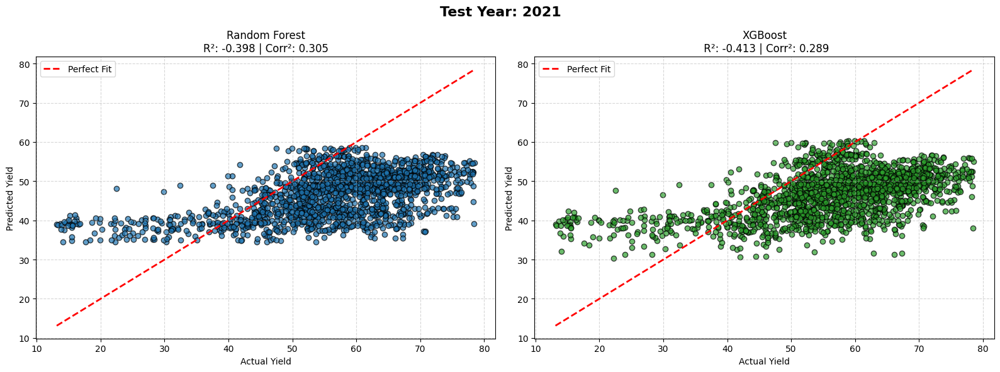


Processing Test Year: 2022...


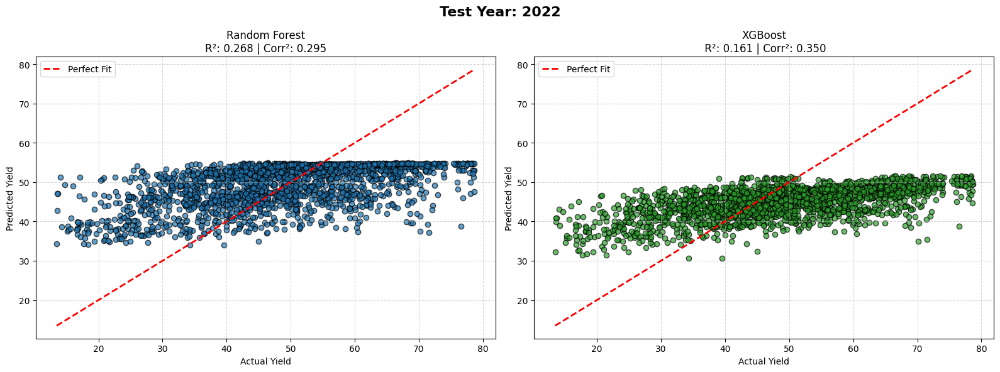


Processing Test Year: 2023...


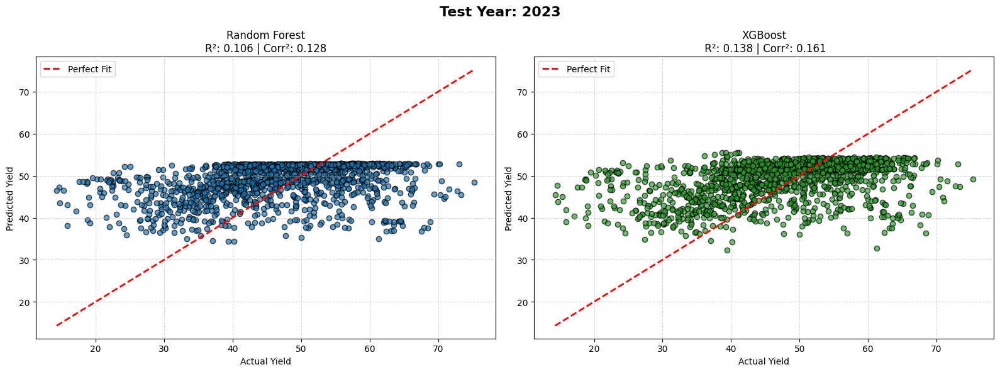


Processing Test Year: 2024...


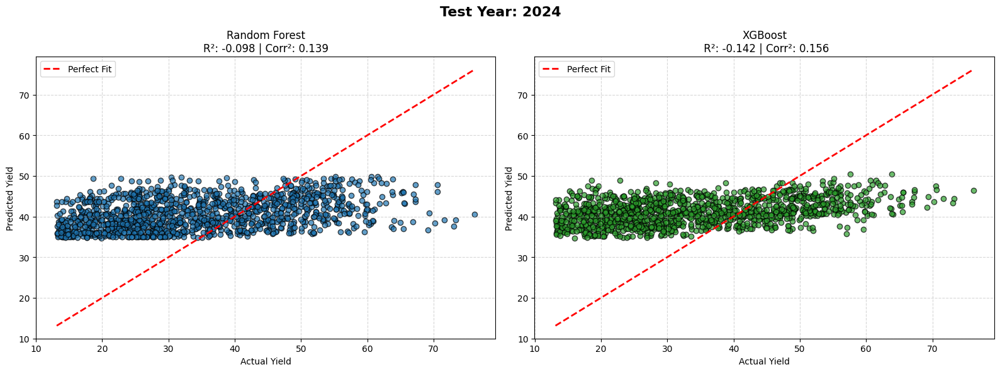


=== FINAL LOYO PERFORMANCE SUMMARY ===
                 R2                     MAE                   CorrSq          
Model Random Forest   XGBoost Random Forest    XGBoost Random Forest   XGBoost
Year                                                                          
2014      -1.218831 -0.742243     15.986551  13.773537      0.232682  0.164358
2015      -0.300124 -0.565994     11.455918  12.778518      0.372644  0.405315
2016       0.288341  0.361041     10.384248   9.744372      0.437660  0.467096
2017       0.258299  0.220584     10.284454  10.125925      0.266577  0.341959
2018       0.328007  0.359267      7.762423   7.595661      0.345743  0.361415
2019      -1.405418 -1.406149     11.138024  11.130649      0.219274  0.257325
2020       0.061211 -0.021867     11.829586  12.486601      0.305904  0.316272
2021      -0.397904 -0.413054     12.218891  12.336545      0.305328  0.289311
2022       0.267857  0.160825      9.540072  10.276146      0.294738  0.350483
2023       0

In [18]:
import numpy as np

YIELD_COL = "yield_mean"
TAIL = 0.02  # 2% tails

EXCLUDE_COLS = {
    'year', 'field', YIELD_COL
}

# -------------------------
# Step 1) Trim extreme 2% of yield (both tails)
# -------------------------
y_lo = df[YIELD_COL].quantile(TAIL)
y_hi = df[YIELD_COL].quantile(1 - TAIL)

mask_yield_ok = df[YIELD_COL].between(y_lo, y_hi)
df = df.loc[mask_yield_ok].copy()

# -------------------------
# Step 2) One-shot trim extremes (2% tails) for ALL numeric features
# -------------------------
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
feature_cols = [
    "GI_max", "GI_mean", "GI_range",
    "NDVI_max", "NDVI_mean", "NDVI_range",
    # 'Soil_Alpha',
    #    'Soil_BD', 'Soil_Clay', 'Soil_Ksat', 'Soil_Lambda', 'Soil_N', 'Soil_OM',
    #    'Soil_Sand', 'Soil_Silt', 'Soil_Theta_R', 'Soil_Theta_S', 'Soil_pH',
       'Tr_SWIR1_max', 'Tr_SWIR1_mean', 'Tr_SWIR1_range', 'Tr_SWIR2_max',
       'Tr_SWIR2_mean', 'Tr_SWIR2_range',
]

feature_cols = ['elevation', 'Tr_SWIR1_max', 'Tr_SWIR1_mean', 'Tr_SWIR1_range', 'Tr_SWIR2_max',  'Tr_SWIR2_mean', 'Tr_SWIR2_range',]

# If you want to ignore columns with all-NaN or near-constant behavior:
feature_cols = [c for c in feature_cols if df[c].notna().any()]

q_low  = df[feature_cols].quantile(TAIL)
q_high = df[feature_cols].quantile(1 - TAIL)

low_extreme  = df[feature_cols].lt(q_low, axis="columns")
high_extreme = df[feature_cols].gt(q_high, axis="columns")

# (Optional but recommended) treat NaN in any feature as "bad row"
any_missing = df[feature_cols].isna().any(axis=1)

any_extreme = (low_extreme | high_extreme).any(axis=1)

df = df.loc[~(any_extreme | any_missing)].copy()

print("df updated.")
print("Final rows:", len(df))
print("Removed due to extremes:", int(any_extreme.sum()))
print("Removed due to missing:", int(any_missing.sum()))
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# ==========================================
# 1. SETUP HYPERPARAMETERS (Cleaned)
# ==========================================
# I removed the "model__" prefix so they work directly in the regressors

Corn:
# rf_best_params = {
#     'n_estimators': 1000,
#     'min_samples_split': 2,
#     'min_samples_leaf': 2,
#     'max_features': 0.33,
#     'max_depth': 20,
#     'bootstrap': True,
#     'n_jobs': -2,
#     'random_state': 42
# }

# xgb_best_params = {
#     'n_estimators': 1000,
#     'learning_rate': 0.01,
#     'max_depth': 5,
#     'subsample': 0.9,
#     'colsample_bytree': 0.6,
#     'gamma': 0.1,
#     'reg_alpha': 0.1,
#     'reg_lambda': 1.5,
#     'n_jobs': -2,
#     'random_state': 42,
#     'objective': 'reg:squarederror'
# }

# Soybeans:

rf_best_params= {k.replace('model__', ''): v for k, v in rf_search.best_params_.items()}
xgb_best_params= {k.replace('model__', ''): v for k, v in xgb_search.best_params_.items()}

# ==========================================
# 2. DEFINITIONS & PREPARATION
# ==========================================
# Assuming 'df' is already loaded and cleaned from your previous steps
# If not, ensure you run your data loading block first!

# Get list of all unique years in the data to loop through
all_years = sorted(df['year'].unique())

# Storage for final summary
results_list = []

print(f"Starting Leave-One-Year-Out Validation for years: {all_years}")

# Define the Preprocessing Step (Impute + Scale)
# We must redefine this inside the loop or use a fresh pipeline to avoid leakage,
# but since it's stateless apart from fit, a fresh fit per loop is handled by the pipeline.
feature_cols = [
    'EVI_max', 'EVI_mean', 'EVI_range', 'GI_max', 'GI_mean', 'GI_range',
    'LST_max', 'LST_median', 'LST_range', 'NDVI_max', 'NDVI_mean',
    'NDVI_range', 'NDWI_max', 'NDWI_mean', 'NDWI_range', 'Precip_Max_mm',
    'Precip_Mean_mm', 'Precip_Total_mm'
]
target_col = "yield_mean"

# ==========================================
# 3. THE LOYO LOOP
# ==========================================
for test_year in all_years:
    print(f"\nProcessing Test Year: {test_year}...")

    # --- A. Split Data ---
    train_df = df[df['year'] != test_year]
    test_df  = df[df['year'] == test_year]

    X_train = train_df[feature_cols]
    y_train = train_df[target_col]
    X_test  = test_df[feature_cols]
    y_test  = test_df[target_col]

    # Check if we have data for this year (safety check)
    if len(X_test) == 0:
        print(f"Skipping {test_year} (No data)")
        continue

    # --- B. Create Pipelines ---
    # We recreate the pipeline each time to ensure 'fit' is fresh
    preprocessor = ColumnTransformer(
        transformers=[("num", Pipeline([
            ("imputer", SimpleImputer(strategy="median")),
            ("scaler", StandardScaler())
        ]), feature_cols)], remainder="drop"
    )

    model_rf = Pipeline([
        ("prep", preprocessor),
        ("model", RandomForestRegressor(**rf_best_params))
    ])

    model_xgb = Pipeline([
        ("prep", preprocessor),
        ("model", XGBRegressor(**xgb_best_params))
    ])

    # --- C. Train Both Models ---
    model_rf.fit(X_train, y_train)
    model_xgb.fit(X_train, y_train)

    # --- D. Predict ---
    pred_rf = model_rf.predict(X_test)
    pred_xgb = model_xgb.predict(X_test)

    # --- E. Calculate Metrics ---
    def get_metrics(y_true, y_pred):
        mae = mean_absolute_error(y_true, y_pred)
        r2 = r2_score(y_true, y_pred)
        corr, _ = pearsonr(y_true, y_pred)
        return  mae, r2, corr**2

    mae_rf, r2_rf, corr_sq_rf = get_metrics(y_test, pred_rf)
    mae_xgb, r2_xgb, corr_sq_xgb = get_metrics(y_test, pred_xgb)

    # Store for summary
    results_list.append({
        "Year": test_year,
        "Model": "Random Forest",
         "MAE": mae_rf, "R2": r2_rf, "CorrSq": corr_sq_rf
    })
    results_list.append({
        "Year": test_year,
        "Model": "XGBoost",
        "MAE": mae_xgb, "R2": r2_xgb, "CorrSq": corr_sq_xgb
    })

    # ==========================================
    # 4. VISUALIZATION (PER YEAR)
    # ==========================================
    # Create a 1x2 plot (RF left, XGB right)
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    plt.suptitle(f"Test Year: {test_year}", fontsize=16, weight='bold')

    # --- Random Forest Plot ---
    min_val = min(y_test.min(), pred_rf.min(), pred_xgb.min())
    max_val = max(y_test.max(), pred_rf.max(), pred_xgb.max())

    axes[0].scatter(y_test, pred_rf, alpha=0.7, color='tab:blue', edgecolors='k')
    axes[0].plot([min_val, max_val], [min_val, max_val], 'r--', lw=2, label="Perfect Fit")
    axes[0].set_title(f"Random Forest\nR²: {r2_rf:.3f} | Corr²: {corr_sq_rf:.3f}")
    axes[0].set_xlabel("Actual Yield")
    axes[0].set_ylabel("Predicted Yield")
    axes[0].legend()
    axes[0].grid(True, linestyle='--', alpha=0.5)

    # --- XGBoost Plot ---
    axes[1].scatter(y_test, pred_xgb, alpha=0.7, color='tab:green', edgecolors='k')
    axes[1].plot([min_val, max_val], [min_val, max_val], 'r--', lw=2, label="Perfect Fit")
    axes[1].set_title(f"XGBoost\n R²: {r2_xgb:.3f} | Corr²: {corr_sq_xgb:.3f}")
    axes[1].set_xlabel("Actual Yield")
    axes[1].set_ylabel("Predicted Yield")
    axes[1].legend()
    axes[1].grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.show()

# ==========================================
# 5. FINAL SUMMARY TABLE
# ==========================================
results_df = pd.DataFrame(results_list)

# Pivot to compare models side-by-side
summary_pivot = results_df.pivot(index="Year", columns="Model", values=["R2", "MAE", "CorrSq"])

print("\n=== FINAL LOYO PERFORMANCE SUMMARY ===")
pd.set_option('display.max_columns', None)
print(summary_pivot)

# Calculate Average Performance across all years
avg_perf = results_df.groupby("Model")[[ "MAE", "R2", "CorrSq"]].mean()
print("\n=== AVERAGE METRICS (ALL YEARS) ===")
print(avg_perf)